In [1]:
import os

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Subset, ConcatDataset

import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
import random

In [2]:
import segmentation_models_pytorch as smp
from segmentation_models_pytorch.losses import DiceLoss
from segmentation_models_pytorch.utils.metrics import IoU, Fscore, Accuracy

In [3]:
import matplotlib.pyplot as plt

# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image, 'gray')
    plt.show()

# Settings

In [4]:
root = os.getcwd()
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

BATCH = 16
GEN_IN_CHANNELS = 1
GEN_N_CLASSES = 2
DIS_IN_CHANNELS = 1
DIS_N_CLASSES = 1
EPOCH = 100

### Model Settings

#### head

In [5]:
GEN_ACT = "sigmoid"
DIS_ACT = "sigmoid"

### Optimizer Settings

In [6]:
ENCODER = "resnet34"
ENCODER_WEIGHT = None
DECODER_ATT = "scse"
GEN_OPTIM_NAME = "adam"
GEN_init_lr = 1e-4
GEN_momentum = 0.9

In [7]:
DIS_OPTIM_NAME = "adam"
DIS_init_lr = 1e-3
DIS_momentum = 0.9

# Epochs

In [8]:
from codes.activation import Activation
from kornia.filters.canny import Canny

In [9]:
def set_requires_grad(nets, requires_grad=False):
    """Set requies_grad=Fasle for all the networks to avoid unnecessary computations
    Parameters:
    nets (network list)   -- a list of networks
    requires_grad (bool)  -- whether the networks require gradients or not
    """
    if not isinstance(nets, list):
        nets = [nets]
        for net in nets:
            if net is not None:
                for param in net.parameters():
                    param.requires_grad = requires_grad

In [10]:
def replace_relu_to_leakyReLU(model):
    for child_name, child in model.named_children():
        if isinstance(child, nn.ReLU):
            setattr(model, child_name, nn.LeakyReLU())
        else:
            replace_relu_to_leakyReLU(child)

In [11]:
def replace_bn_to_instanceNorm(model):
    for child_name, child in model.named_children():
        if isinstance(child, nn.BatchNorm2d):
            bn = getattr(model, child_name)
            setattr(model, child_name, nn.InstanceNorm2d(bn.num_features))
        else:
            replace_bn_to_instanceNorm(child)

In [12]:
canny_filter = Canny(low_threshold=0, high_threshold=0.1).to(device)

In [13]:
def train_a2b_epoch(generator, gen_optimizer, discriminator, dis_optimizer, dataloader, device):
  
    # change mode to train and move to current device
    generator = generator.train().to(device)
    discriminator = discriminator.train().to(device)
    
    dis_l = 0
    gen_l = 0
    main_l = 0
    sum_l = 0
    for index, data in tqdm(enumerate(dataloader)):

        x, y, *_ = data

        x = x.to(device)
        y = y.to(device)

        *_, edge_x = canny_filter(x)
        *_, edge_y = canny_filter(y)  

        edge_y_pr = generator(edge_x)
        edge_y_pr = Activation(name=GEN_ACT)(edge_y_pr) # zipped value to [0, 1]
        fg = edge_y_pr[:, 1, :, :].unsqueeze(1)
        bg = edge_y_pr[:, 0, :, :].unsqueeze(1)
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        set_requires_grad(discriminator, True)
        dis_optimizer.zero_grad()
        
        y_cls = discriminator(edge_y)
        y_cls = Activation(name=DIS_ACT)(y_cls)
        
        y_pr_cls = discriminator(fg.detach())
        y_pr_cls = Activation(name=DIS_ACT)(y_pr_cls)
       
        _dis = nn.BCELoss()(y_cls.float(), torch.ones(y_cls.size(), dtype=torch.float, device=device)) + \
                                nn.BCELoss()(y_pr_cls.float(), torch.zeros(y_pr_cls.size(), dtype=torch.float, device=device))

        _dis.backward()
        dis_optimizer.step()
        
        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        
        set_requires_grad(discriminator, False)
        gen_optimizer.zero_grad()
        
        # main constraint
        fg_ = torch.square(fg)
        bg_ = torch.square(bg)
        _main = torch.nn.L1Loss()(fg_+bg_, torch.ones(fg_.size(), dtype=torch.float, device=device))
        
        sum_ = torch.nn.AdaptiveAvgPool2d(1)(edge_y_pr)
        _sum = torch.nn.L1Loss()(sum_, torch.ones(sum_.size(), dtype=torch.float, device=device))
        
        # adversarial loss
        y_pr_cls = discriminator(fg)
        y_pr_cls = Activation(name=DIS_ACT)(y_pr_cls)
        _gen = nn.BCELoss()(y_pr_cls.float(), torch.ones(y_pr_cls.size(), dtype=torch.float, device=device))

        loss = _gen + _main + _sum
        loss.backward()    
        gen_optimizer.step()

        dis_l += _dis.item()
        gen_l += _gen.item()
        main_l += _main.item()
        sum_l += _sum.item()
        
    return  main_l/(index+1), sum_l/(index+1), gen_l/(index+1), dis_l/(index+1)

In [14]:
@torch.no_grad()
def eval_epoch(generator, discriminator, dataloader, device):
  
    # change mode to train and move to current device
    generator = generator.eval().to(device)
    discriminator = discriminator.eval().to(device)

    acc_ = []
    for index, data in tqdm(enumerate(dataloader)):

        x, y, *_ = data

        x = x.to(device)
        y = y.to(device)

        *_, edge_x = canny_filter(x)
        *_, edge_y = canny_filter(y)  

        edge_y_pr = generator(edge_x)
        edge_y_pr = Activation(name=GEN_ACT)(edge_y_pr) # zipped value to [0, 1]
        fg = edge_y_pr[:, 1, :, :].unsqueeze(1)
        bg = edge_y_pr[:, 0, :, :].unsqueeze(1)
        
        y_cls = discriminator(edge_y)
        y_cls = Activation(name=DIS_ACT)(y_cls)
        y_pr_cls = discriminator(fg)
        y_pr_cls = Activation(name=DIS_ACT)(y_pr_cls)
        
        # adversarial
        y_cls = torch.where(y_cls > 0.5, 1, 0)
        acc = Accuracy()(y_cls, torch.ones(y_cls.size(), device=y_cls.device))
        acc_ += [acc.item()]
        y_pr_cls = torch.where(y_pr_cls > 0.5, 1, 0)
        acc = Accuracy()(y_pr_cls, torch.zeros(y_pr_cls.size(), device=y_pr_cls.device))
        acc_ += [acc.item()]


    return  sum(acc_)/len(acc_)

In [15]:
@torch.no_grad()
def test_epoch(model, dataloader, device, save=False, path=None):
  
    # change mode to train and move to current device
    model = model.eval().to(device)
    
    iid = 0
    for index, data in tqdm(enumerate(dataloader)):

        x, y, *_ = data

        x = x.to(device)
        y = y.to(device)

        *_, edge_x = canny_filter(x)
        *_, edge_y = canny_filter(y)  

        edge_y_pr = model(edge_x)
        edge_y_pr = Activation(name=GEN_ACT)(edge_y_pr) # zipped value to [0, 1]
        fg = edge_y_pr[:, 1, :, :].unsqueeze(1)
        bg = edge_y_pr[:, 0, :, :].unsqueeze(1)
        
        y_cls = discriminator(edge_y)
        y_cls = Activation(name=DIS_ACT)(y_cls)
        y_pr_cls = discriminator(fg)
        y_pr_cls = Activation(name=DIS_ACT)(y_pr_cls)   
        
        for b in range(x.shape[0]):
            
            print("edge of ct_pred = {}, edge of ct_true = {}".format(y_pr_cls[b, :].squeeze().item(), y_cls[b, :].squeeze().item()))
            print(torch.min(edge_y[b, :]), torch.max(edge_y[b, :]), torch.min(edge_y_pr[b, :]), torch.max(edge_y_pr[b, :]))
            
            _edge = edge_y[b, :].squeeze().cpu().numpy()
            _edge_pr = fg[b, :].squeeze().cpu().numpy()
            _edge_bg = bg[b, :].squeeze().cpu().numpy()
            
            visualize(
                edge_true = _edge,
                edge_pr = _edge_pr,
                edge_bg = _edge_bg
            )
            
            if save:
                path_dir = os.path.join(path, "file_{}".format(iid))
                try:
                    os.mkdir(path_dir)
                except FileExistsError:
                    pass
                
                cv2.imwrite(os.path.join(path_dir, "edge_bg.jpg"), (_edge_bg * 255).astype(np.uint8))
                cv2.imwrite(os.path.join(path_dir, "edge_pred.jpg"), (_edge_pr * 255).astype(np.uint8))
                cv2.imwrite(os.path.join(path_dir, "edge_true.jpg"), (_edge * 255).astype(np.uint8))
                
            iid += 1

# Discriminator

In [16]:
from codes.activation import Activation
import torchvision.models as models

In [17]:
class Model(nn.Module):
    def __init__(self, in_channel=1, n_classes=2, activation=None):
        
        super(Model, self).__init__()
        
        encoder = models.resnet34()
        encoder.conv1 = nn.Conv2d(in_channel, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        encoder.fc = nn.Linear(in_features=512, out_features=n_classes)
        self.encoder = encoder
        self.activation = Activation(name=activation)
        
        
    def forward(self, x):
        x = self.encoder(x)
        return self.activation(x)

# Read Data

In [18]:
from codes.dataset import Dataset
import codes.augmentation as aug

In [19]:
train_case_path = 'raw/train/*_*'
test_case_path = 'raw/test/*_*'

In [20]:
trainset = Dataset(train_case_path, geometry_aug=aug.get_training_augmentation())
testset = Dataset(test_case_path, geometry_aug=aug.get_validation_augmentation())

In [21]:
len(trainset), len(testset)

(1344, 191)

In [22]:
x, y, *_ = trainset[20]

(<matplotlib.image.AxesImage at 0x7fa02c1475b0>,)

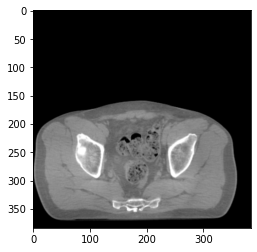

In [23]:
plt.imshow(x.squeeze(), 'gray'),

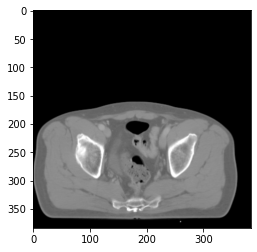

In [24]:
plt.imshow(y.squeeze(), 'gray')

In [25]:
x.shape, y.shape

((1, 384, 384), (1, 384, 384))

# training

In [26]:
import wandb

wandb.init(project="cbct_edge", config={
    "data": {
        "batchsize": BATCH,
    },
    "epochs": EPOCH,
    "model": {
        "in_channels": GEN_IN_CHANNELS,
        "out_channels": GEN_N_CLASSES,
        "optimizer": GEN_OPTIM_NAME,
        "init_lr": GEN_init_lr,
        "momentum": GEN_momentum,
        "encoder": ENCODER,
        "encoder_weight": ENCODER_WEIGHT,
        "activation": GEN_ACT,
        "decoder_attention_type": DECODER_ATT
    },
    "discriminator": {
        "in_channels": DIS_IN_CHANNELS,
        "out_channels": DIS_N_CLASSES,
        "optimizer": DIS_OPTIM_NAME,
        "init_lr": DIS_init_lr,
        "momentum": DIS_momentum,
        "encoder": "resnet152"
    }
})

wandb: Currently logged in as: junjun (use `wandb login --relogin` to force relogin)
wandb: wandb version 0.12.10 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


In [27]:
trainloader = torch.utils.data.DataLoader(trainset, batch_size=BATCH, shuffle=True, num_workers=8)
testloader = torch.utils.data.DataLoader(testset, batch_size=BATCH, shuffle=False, num_workers=4)

In [28]:
import segmentation_models_pytorch as smp
import torchvision.models as models

model = smp.Unet(encoder_name=ENCODER, encoder_weights=ENCODER_WEIGHT, in_channels=GEN_IN_CHANNELS, classes=GEN_N_CLASSES)

In [29]:
discriminator = Model(in_channel=DIS_IN_CHANNELS, n_classes=DIS_N_CLASSES, activation=DIS_ACT)

In [30]:
models.resnet34()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [31]:
from codes.optimizer import Optimizer
# optimizer = optim.SGD(model.parameters(), lr=init_lr, momentum=momentum)
gen_optimizer = Optimizer(model.parameters(), name=GEN_OPTIM_NAME, lr=GEN_init_lr)
dis_optimizer = Optimizer(discriminator.parameters(), name=DIS_OPTIM_NAME, lr=DIS_init_lr)

In [32]:
wandb.watch(model)
wandb.watch(discriminator)

max_score = 0

for epoch in range(EPOCH):
        
        loss_main, loss_sum, loss_gen, loss_dis = train_a2b_epoch(model, gen_optimizer, discriminator, dis_optimizer, trainloader, device)
        score_acc_train = eval_epoch(model, discriminator, trainloader, device)
        score_acc_test = eval_epoch(model, discriminator, testloader, device)

        
        wandb.log({
            "loss gen": loss_gen,
            "loss dis": loss_dis,
            "loss main": loss_main,
            "loss sum": loss_sum,
            "trainset acc score": score_acc_train,
            "testset acc score": score_acc_test
        })
        
        
        if score_acc_test  >  max_score:
            max_score = score_acc_test
            checkpoint = {
                "model": model.state_dict(),
                "optimizer": gen_optimizer.state_dict(),
                "dicriminator": discriminator.state_dict(),
                "dis_optim": dis_optimizer.state_dict()
            }
            torch.save(checkpoint, os.path.join("weight-edge", "{}.pth".format(wandb.run.name)))

84it [01:07,  1.24it/s]
84it [00:40,  2.09it/s]
12it [00:05,  2.20it/s]
84it [01:06,  1.26it/s]
84it [00:40,  2.09it/s]
12it [00:05,  2.19it/s]
84it [01:06,  1.26it/s]
84it [00:39,  2.11it/s]
12it [00:05,  2.18it/s]
84it [01:05,  1.28it/s]
84it [00:40,  2.10it/s]
12it [00:05,  2.19it/s]
84it [01:06,  1.26it/s]
84it [00:39,  2.11it/s]
12it [00:05,  2.19it/s]
84it [01:06,  1.26it/s]
84it [00:40,  2.07it/s]
12it [00:05,  2.19it/s]
84it [01:06,  1.26it/s]
84it [00:40,  2.07it/s]
12it [00:05,  2.19it/s]
84it [01:06,  1.26it/s]
84it [00:39,  2.10it/s]
12it [00:05,  2.19it/s]
84it [01:07,  1.25it/s]
84it [00:40,  2.07it/s]
12it [00:05,  2.18it/s]
84it [01:06,  1.27it/s]
84it [00:40,  2.09it/s]
12it [00:05,  2.20it/s]
84it [01:06,  1.27it/s]
84it [00:40,  2.07it/s]
12it [00:05,  2.18it/s]
84it [01:06,  1.26it/s]
84it [00:39,  2.12it/s]
12it [00:05,  2.19it/s]
84it [01:07,  1.25it/s]
84it [00:39,  2.10it/s]
12it [00:05,  2.19it/s]
84it [01:06,  1.26it/s]
84it [00:40,  2.06it/s]
12it [00:05,  2.

In [33]:
checkpoint = torch.load(os.path.join("weight-edge", "{}.pth".format(wandb.run.name)))

In [34]:
model = smp.Unet(encoder_name=ENCODER, encoder_weights=ENCODER_WEIGHT, in_channels=GEN_IN_CHANNELS, classes=GEN_N_CLASSES)

In [35]:
dir_path = os.path.join("eval-edge", wandb.run.name)
try:
    os.mkdir(dir_path)
except FileExistsError:
    pass

0it [00:00, ?it/s]

edge of ct_pred = 0.5772971510887146, edge of ct_true = 0.6207290291786194
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.7721e-22, device='cuda:0') tensor(1., device='cuda:0')


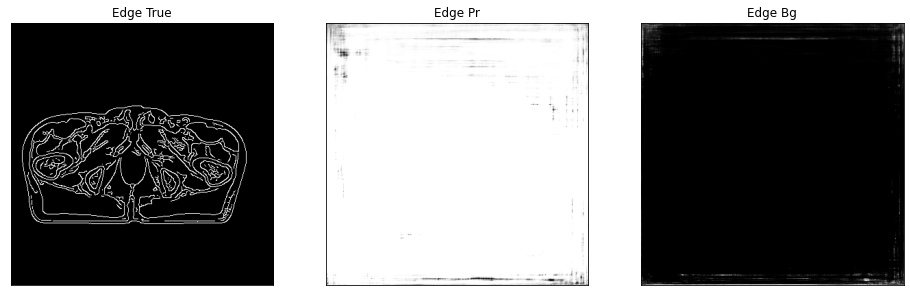

edge of ct_pred = 0.5772525072097778, edge of ct_true = 0.6213443875312805
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.0450e-22, device='cuda:0') tensor(1., device='cuda:0')


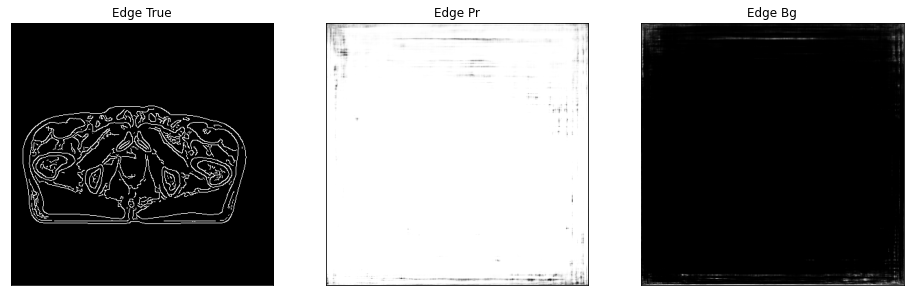

edge of ct_pred = 0.5773507356643677, edge of ct_true = 0.621001124382019
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.1529e-23, device='cuda:0') tensor(1., device='cuda:0')


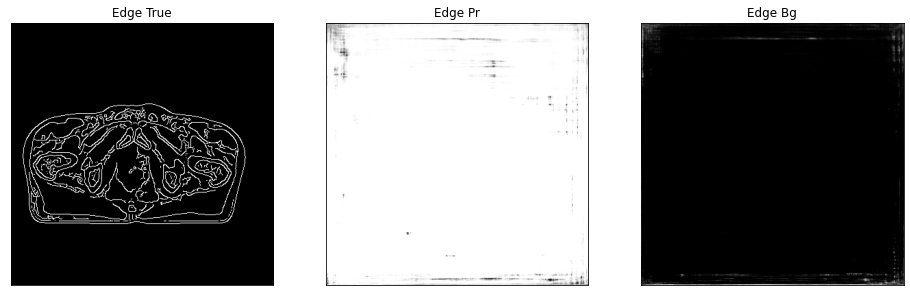

edge of ct_pred = 0.5772420763969421, edge of ct_true = 0.6194234490394592
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.9934e-23, device='cuda:0') tensor(1., device='cuda:0')


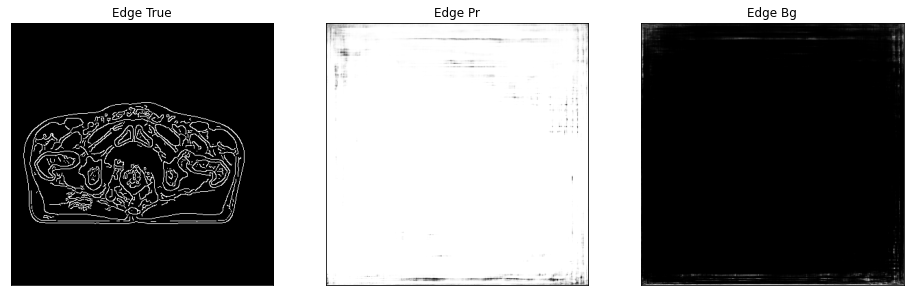

edge of ct_pred = 0.5773274898529053, edge of ct_true = 0.6194803714752197
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.4095e-23, device='cuda:0') tensor(1., device='cuda:0')


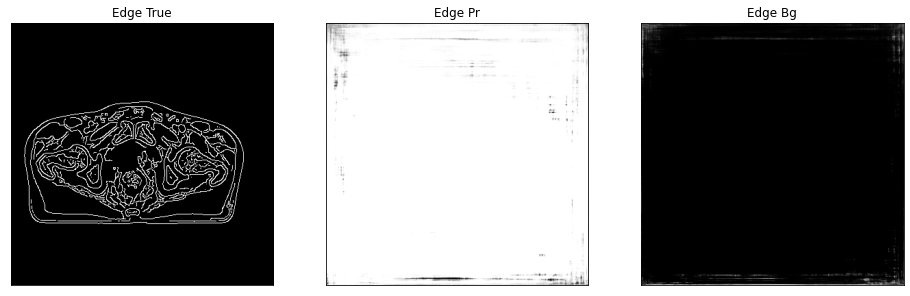

edge of ct_pred = 0.5773451328277588, edge of ct_true = 0.6189515590667725
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(8.6194e-24, device='cuda:0') tensor(1., device='cuda:0')


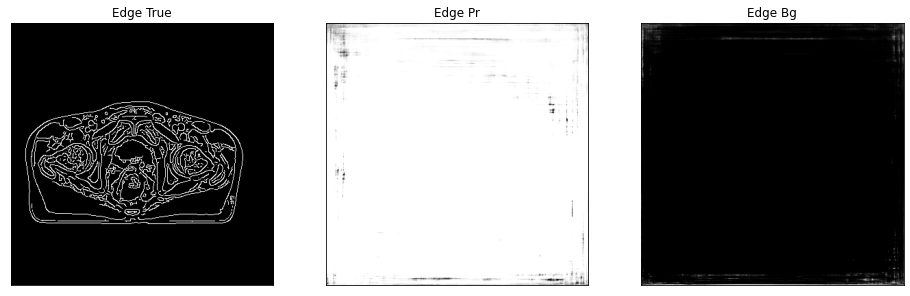

edge of ct_pred = 0.5771727561950684, edge of ct_true = 0.6186999082565308
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.6729e-23, device='cuda:0') tensor(1., device='cuda:0')


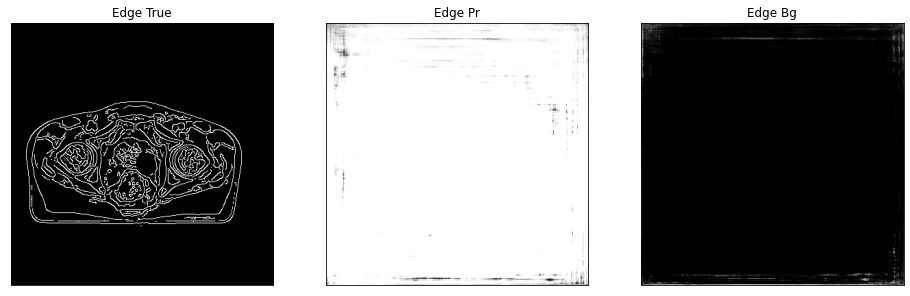

edge of ct_pred = 0.5774285197257996, edge of ct_true = 0.6202194690704346
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.2448e-23, device='cuda:0') tensor(1., device='cuda:0')


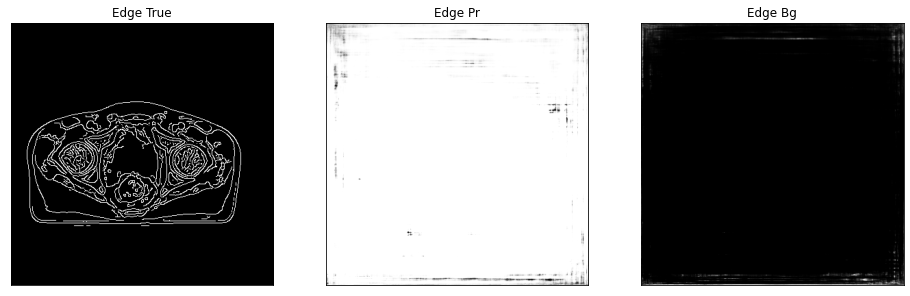

edge of ct_pred = 0.5774841904640198, edge of ct_true = 0.6193090677261353
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.7209e-22, device='cuda:0') tensor(1., device='cuda:0')


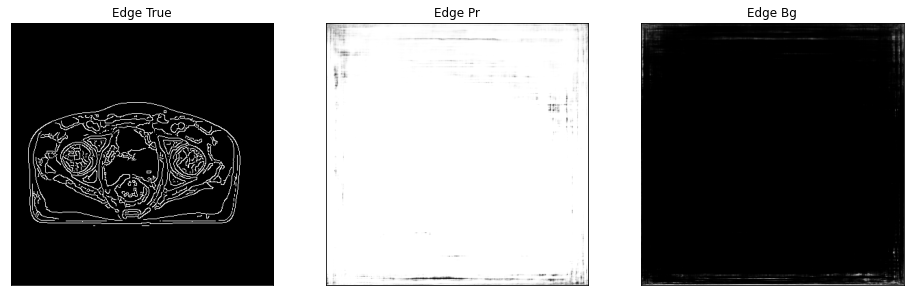

edge of ct_pred = 0.5773649215698242, edge of ct_true = 0.6205453276634216
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.6670e-23, device='cuda:0') tensor(1., device='cuda:0')


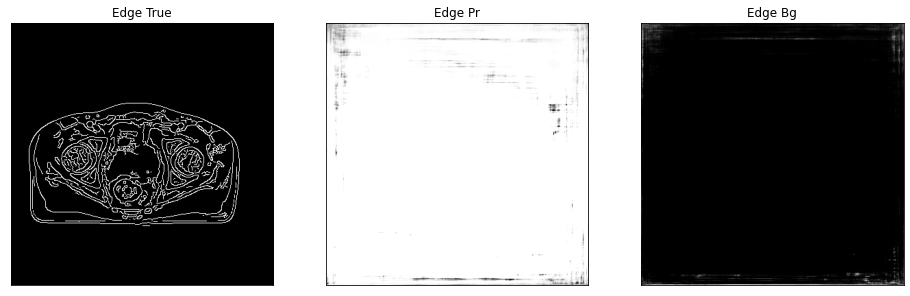

edge of ct_pred = 0.577243983745575, edge of ct_true = 0.6207385063171387
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.7596e-22, device='cuda:0') tensor(1., device='cuda:0')


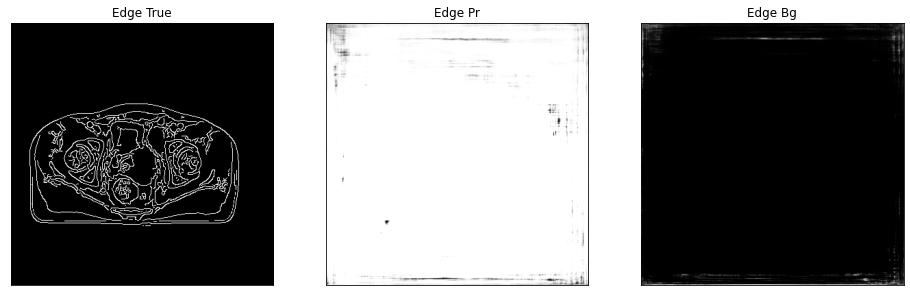

edge of ct_pred = 0.5773587226867676, edge of ct_true = 0.6208614706993103
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(5.5456e-22, device='cuda:0') tensor(1., device='cuda:0')


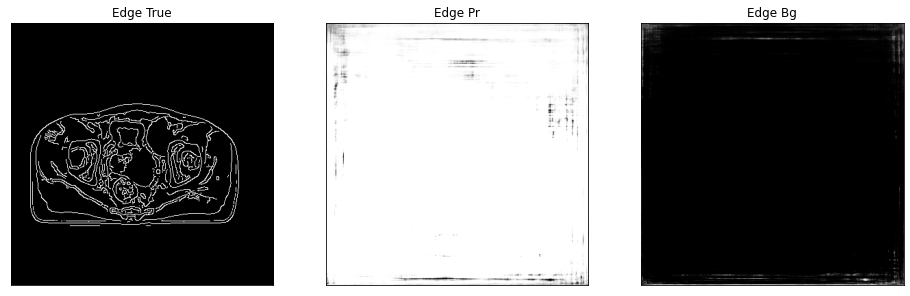

edge of ct_pred = 0.5775931477546692, edge of ct_true = 0.6208396553993225
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.7607e-22, device='cuda:0') tensor(1., device='cuda:0')


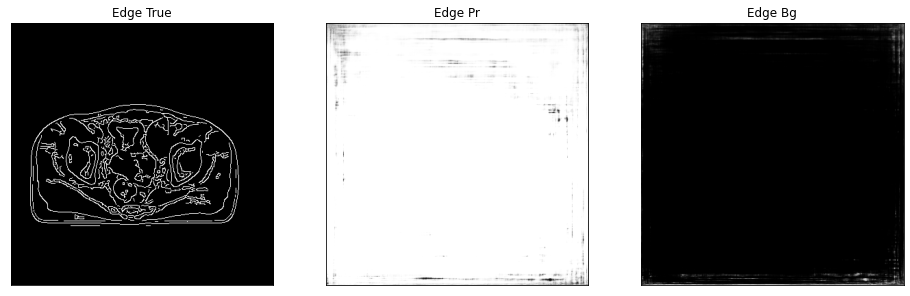

edge of ct_pred = 0.5776076912879944, edge of ct_true = 0.621063232421875
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.8887e-22, device='cuda:0') tensor(1., device='cuda:0')


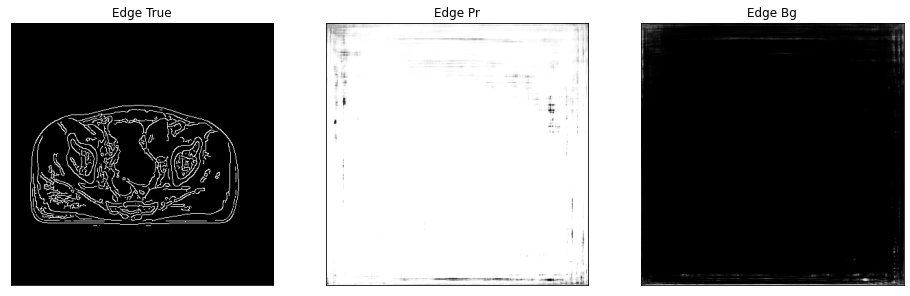

edge of ct_pred = 0.5770314335823059, edge of ct_true = 0.620868980884552
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(5.2078e-23, device='cuda:0') tensor(1., device='cuda:0')


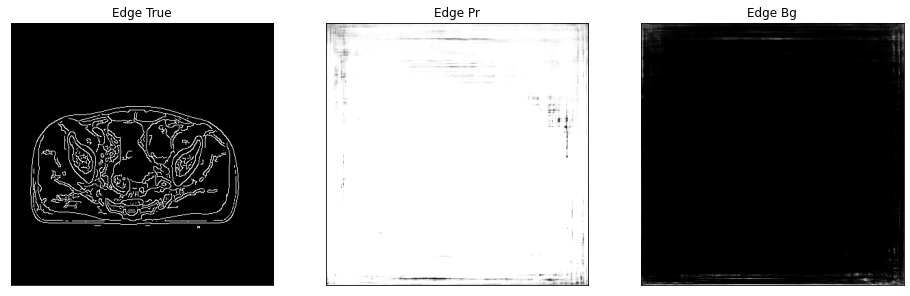

edge of ct_pred = 0.5774998664855957, edge of ct_true = 0.6195436716079712
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.8472e-23, device='cuda:0') tensor(1., device='cuda:0')


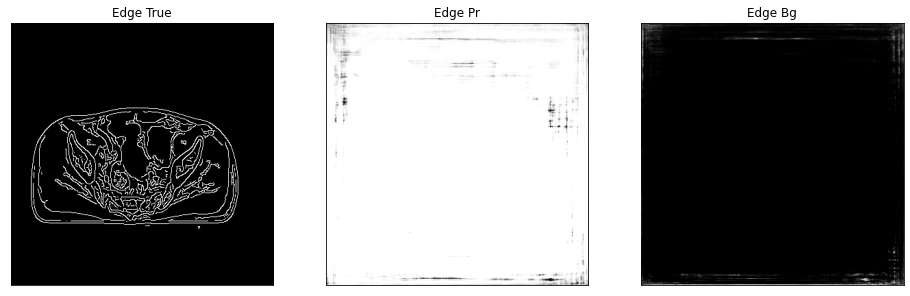

1it [00:04,  4.02s/it]

edge of ct_pred = 0.5771794319152832, edge of ct_true = 0.6196452379226685
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.6875e-22, device='cuda:0') tensor(1., device='cuda:0')


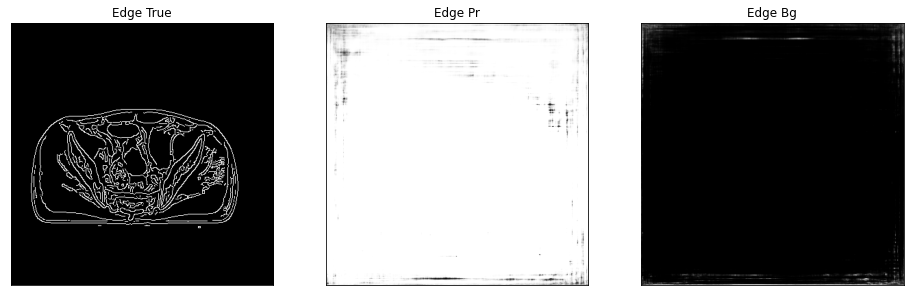

edge of ct_pred = 0.5771839618682861, edge of ct_true = 0.6198742985725403
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.5029e-23, device='cuda:0') tensor(1., device='cuda:0')


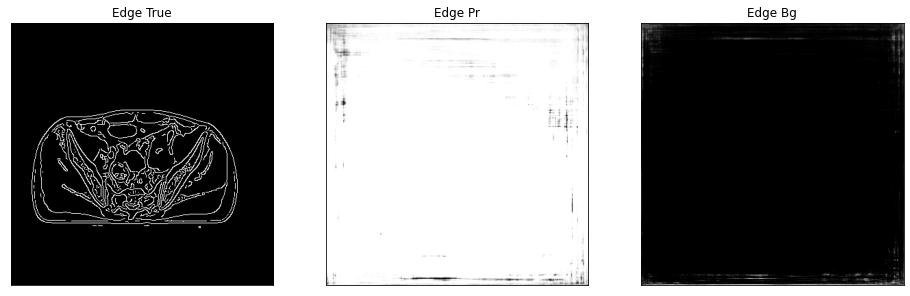

edge of ct_pred = 0.5774590373039246, edge of ct_true = 0.6191303730010986
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(7.9019e-24, device='cuda:0') tensor(1., device='cuda:0')


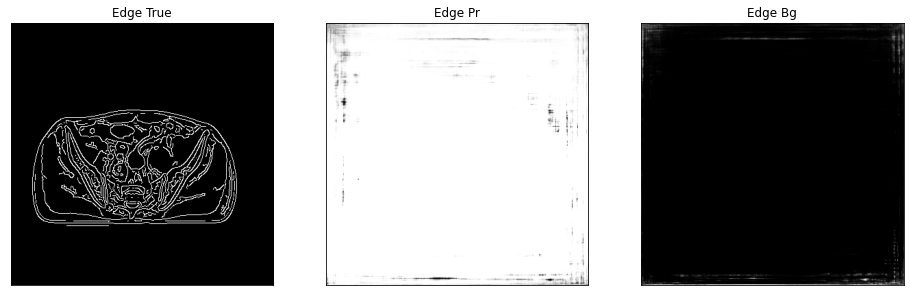

edge of ct_pred = 0.5775986313819885, edge of ct_true = 0.6192578673362732
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.1515e-23, device='cuda:0') tensor(1., device='cuda:0')


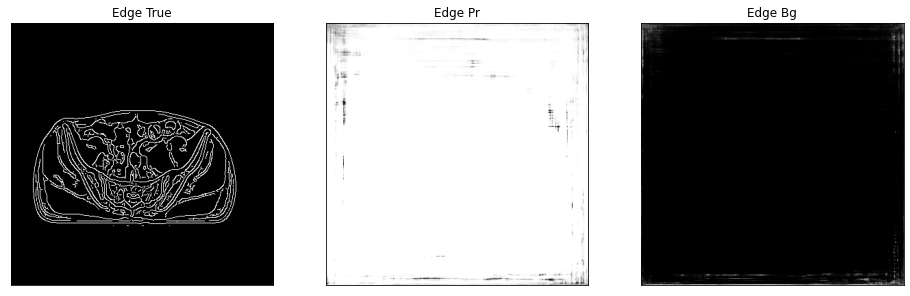

edge of ct_pred = 0.577454686164856, edge of ct_true = 0.6187703609466553
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.7755e-24, device='cuda:0') tensor(1., device='cuda:0')


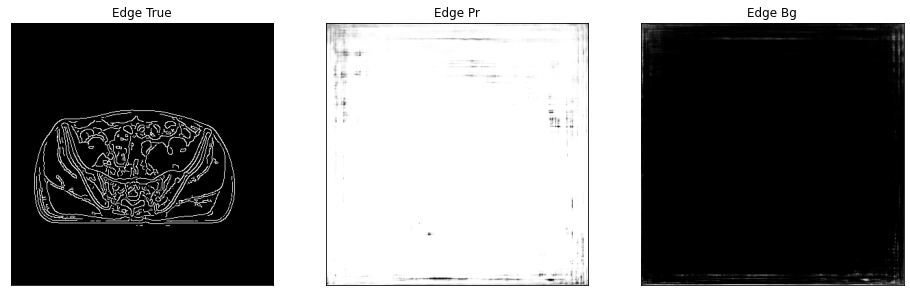

edge of ct_pred = 0.5773836970329285, edge of ct_true = 0.6204220056533813
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(8.2734e-24, device='cuda:0') tensor(1., device='cuda:0')


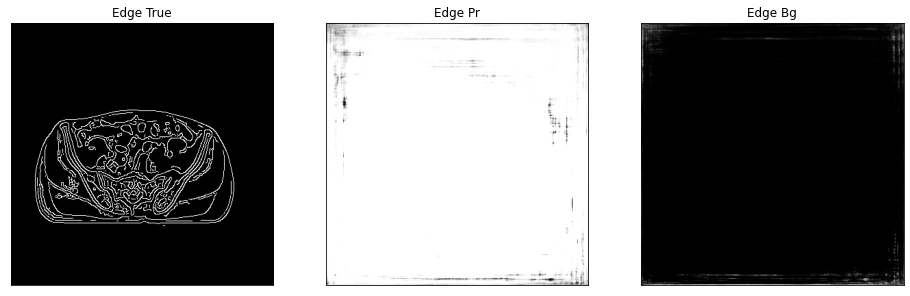

edge of ct_pred = 0.5774677395820618, edge of ct_true = 0.619218647480011
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.9333e-23, device='cuda:0') tensor(1., device='cuda:0')


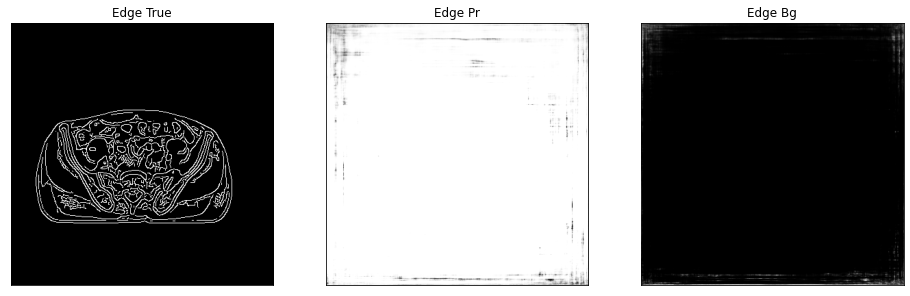

edge of ct_pred = 0.5774891972541809, edge of ct_true = 0.6197685599327087
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.6076e-24, device='cuda:0') tensor(1., device='cuda:0')


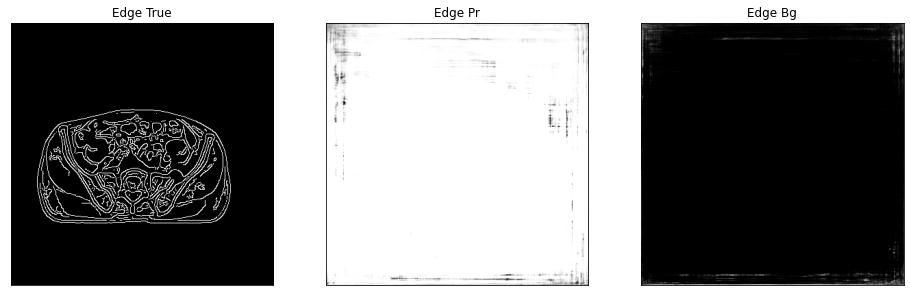

edge of ct_pred = 0.577688455581665, edge of ct_true = 0.6200770139694214
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.9785e-23, device='cuda:0') tensor(1., device='cuda:0')


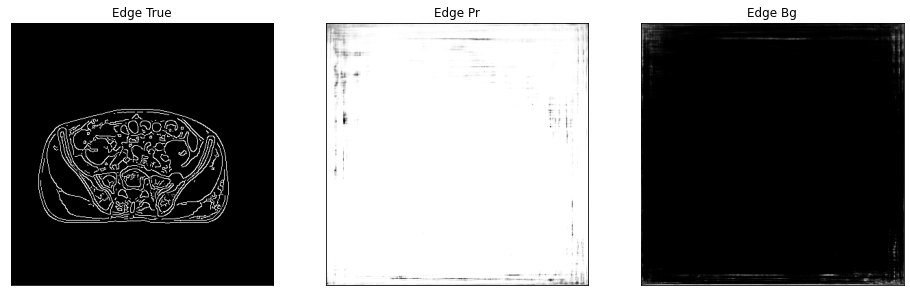

edge of ct_pred = 0.5773955583572388, edge of ct_true = 0.6202952861785889
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.5091e-24, device='cuda:0') tensor(1., device='cuda:0')


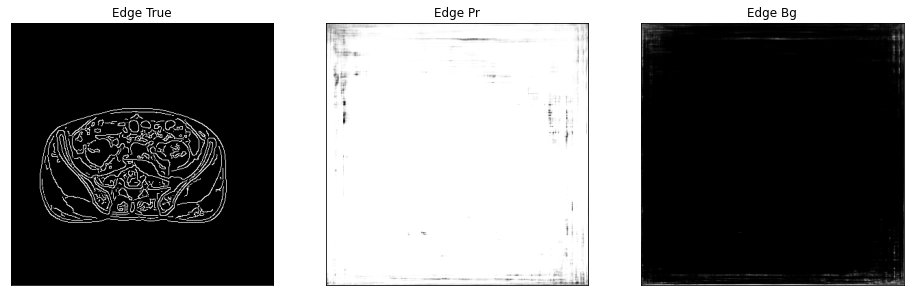

edge of ct_pred = 0.5775192975997925, edge of ct_true = 0.6195805668830872
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.3408e-24, device='cuda:0') tensor(1., device='cuda:0')


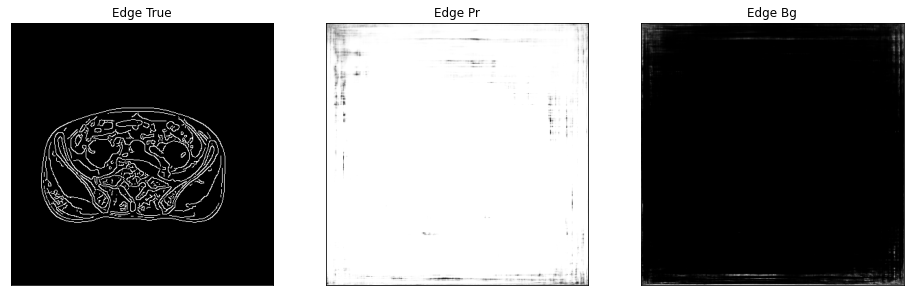

edge of ct_pred = 0.5774532556533813, edge of ct_true = 0.6207738518714905
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.2540e-24, device='cuda:0') tensor(1., device='cuda:0')


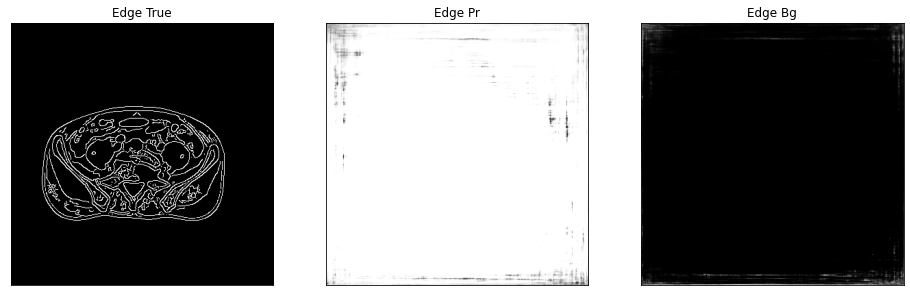

edge of ct_pred = 0.5778446793556213, edge of ct_true = 0.6164929866790771
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.5282e-25, device='cuda:0') tensor(1., device='cuda:0')


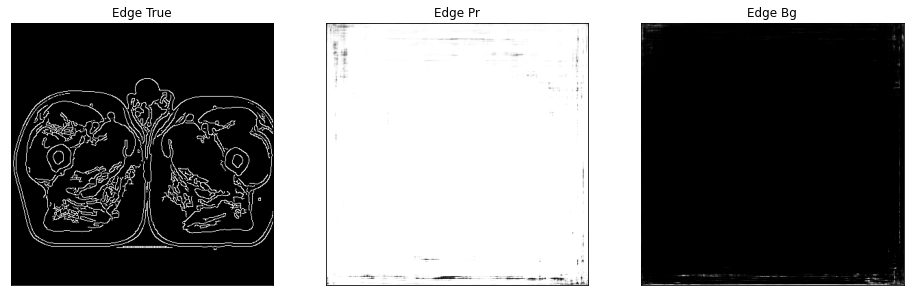

edge of ct_pred = 0.5783060789108276, edge of ct_true = 0.6180267930030823
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(7.5611e-25, device='cuda:0') tensor(1., device='cuda:0')


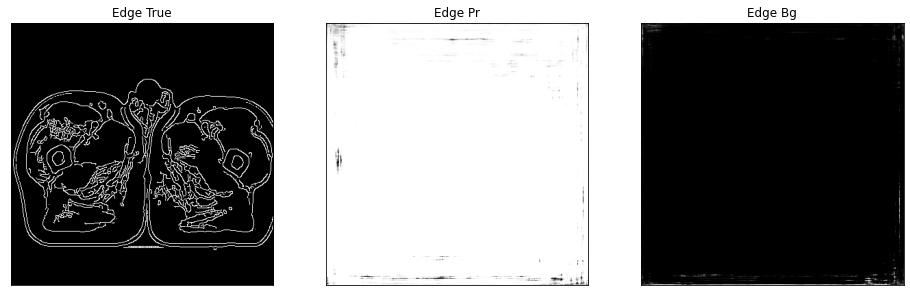

edge of ct_pred = 0.5782940983772278, edge of ct_true = 0.6170695424079895
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.3212e-24, device='cuda:0') tensor(1., device='cuda:0')


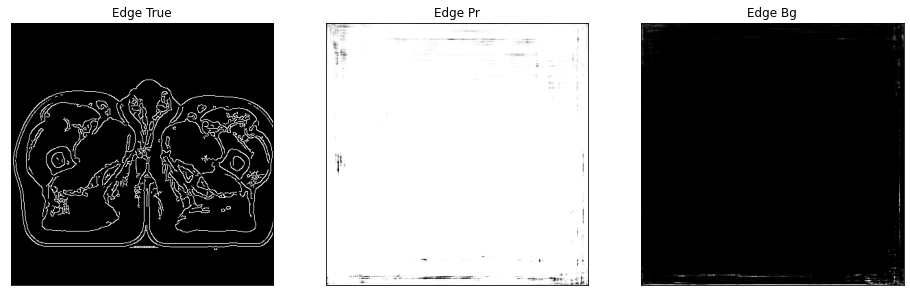

edge of ct_pred = 0.5783278346061707, edge of ct_true = 0.6172248721122742
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.1127e-24, device='cuda:0') tensor(1., device='cuda:0')


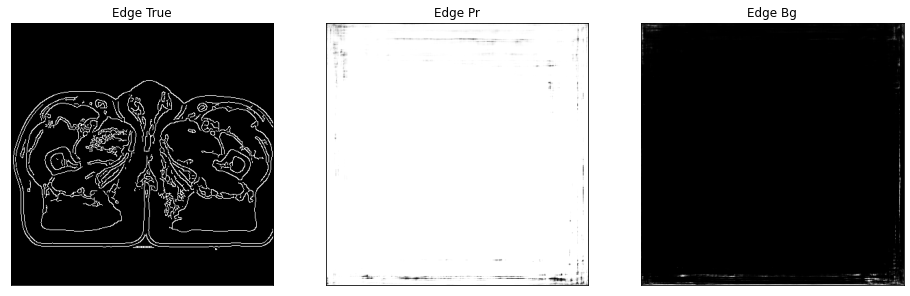

2it [00:06,  3.67s/it]

edge of ct_pred = 0.5780794620513916, edge of ct_true = 0.6179002523422241
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.0852e-24, device='cuda:0') tensor(1., device='cuda:0')


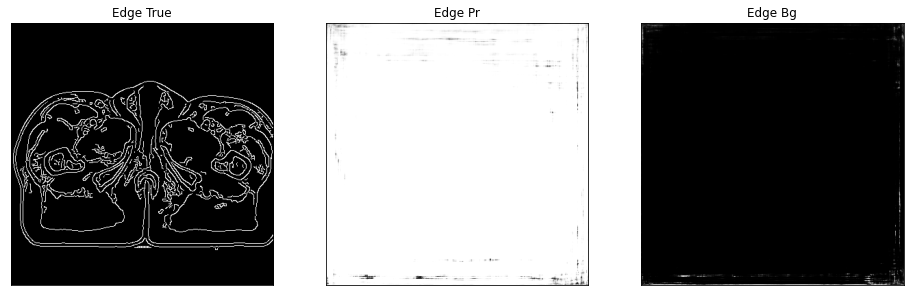

edge of ct_pred = 0.5778770446777344, edge of ct_true = 0.615633487701416
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.4296e-24, device='cuda:0') tensor(1., device='cuda:0')


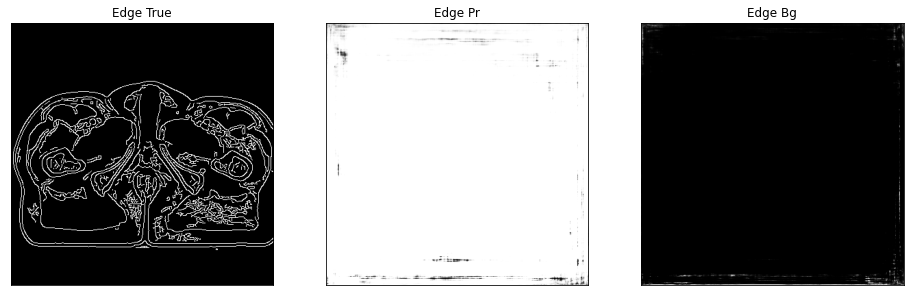

edge of ct_pred = 0.5776576399803162, edge of ct_true = 0.6180118322372437
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.8865e-24, device='cuda:0') tensor(1., device='cuda:0')


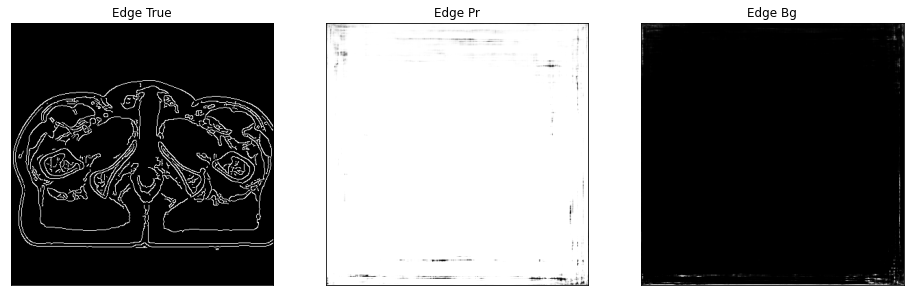

edge of ct_pred = 0.578254222869873, edge of ct_true = 0.6172265410423279
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.4592e-24, device='cuda:0') tensor(1., device='cuda:0')


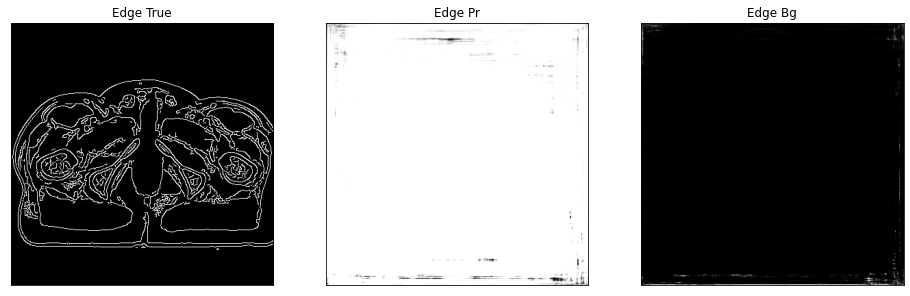

edge of ct_pred = 0.5783762335777283, edge of ct_true = 0.6155820488929749
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.3647e-26, device='cuda:0') tensor(1., device='cuda:0')


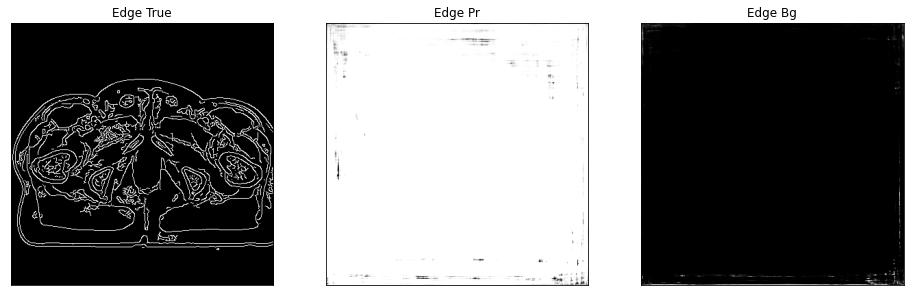

edge of ct_pred = 0.5780828595161438, edge of ct_true = 0.6149381995201111
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.5718e-25, device='cuda:0') tensor(1., device='cuda:0')


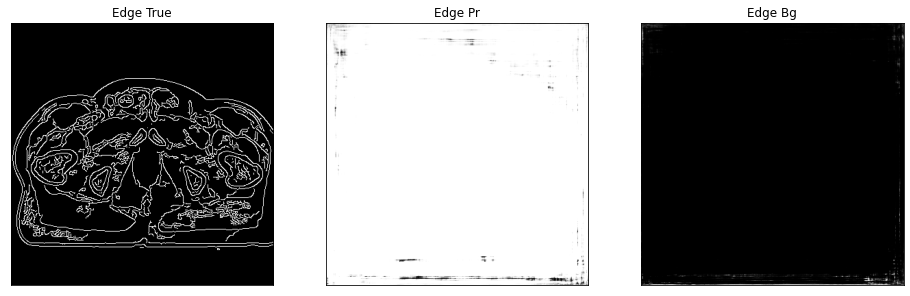

edge of ct_pred = 0.578363299369812, edge of ct_true = 0.6146203875541687
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.9259e-24, device='cuda:0') tensor(1., device='cuda:0')


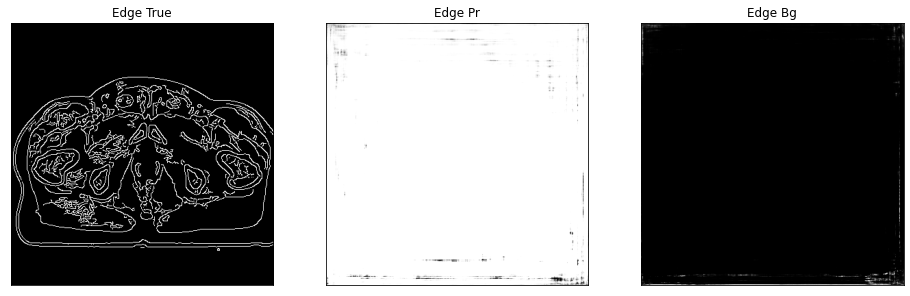

edge of ct_pred = 0.5787543654441833, edge of ct_true = 0.6145151853561401
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.0721e-24, device='cuda:0') tensor(1., device='cuda:0')


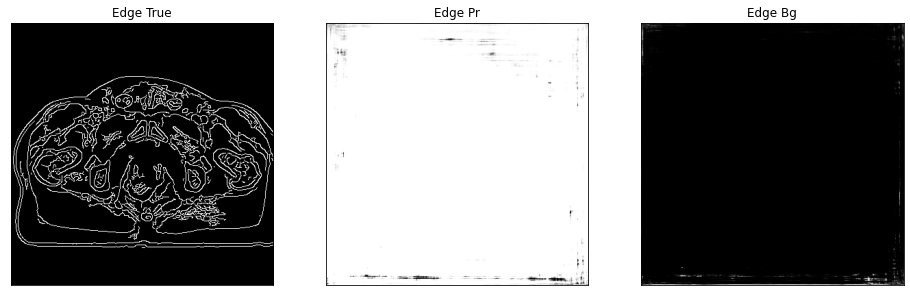

edge of ct_pred = 0.5780230164527893, edge of ct_true = 0.6136488318443298
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.4465e-25, device='cuda:0') tensor(1., device='cuda:0')


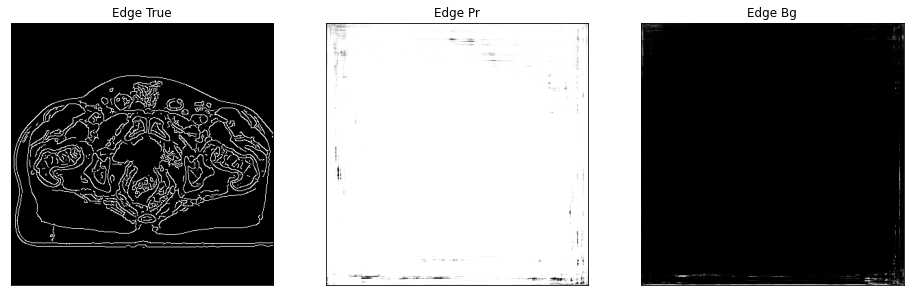

edge of ct_pred = 0.5785163640975952, edge of ct_true = 0.6129980683326721
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.4400e-24, device='cuda:0') tensor(1., device='cuda:0')


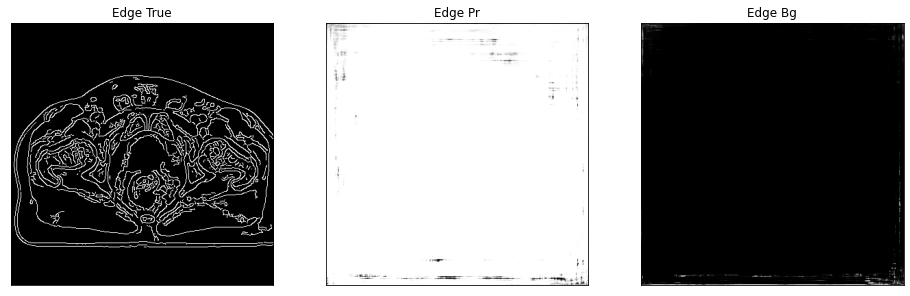

edge of ct_pred = 0.5783827900886536, edge of ct_true = 0.612773597240448
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.4842e-24, device='cuda:0') tensor(1., device='cuda:0')


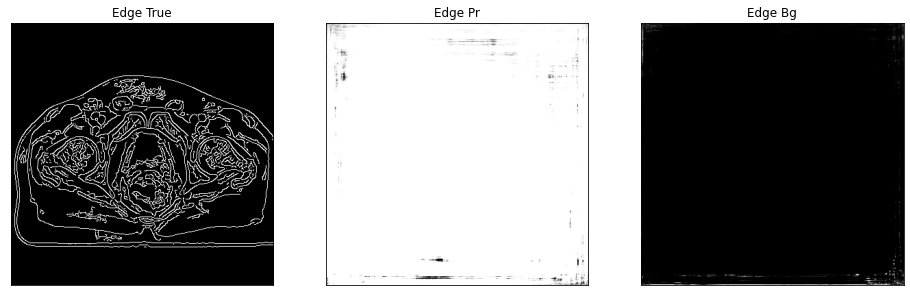

edge of ct_pred = 0.578112006187439, edge of ct_true = 0.6120783090591431
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.0849e-25, device='cuda:0') tensor(1., device='cuda:0')


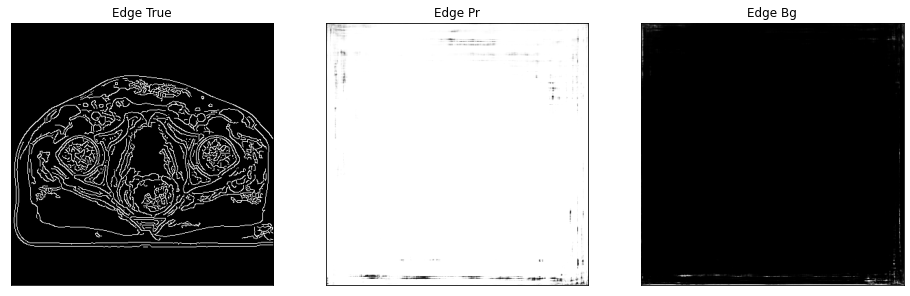

edge of ct_pred = 0.5787915587425232, edge of ct_true = 0.6140640377998352
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.9519e-25, device='cuda:0') tensor(1., device='cuda:0')


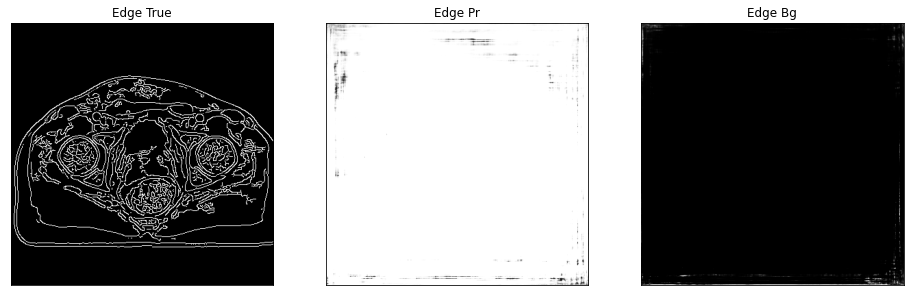

edge of ct_pred = 0.5785014033317566, edge of ct_true = 0.6125553846359253
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(9.2039e-25, device='cuda:0') tensor(1., device='cuda:0')


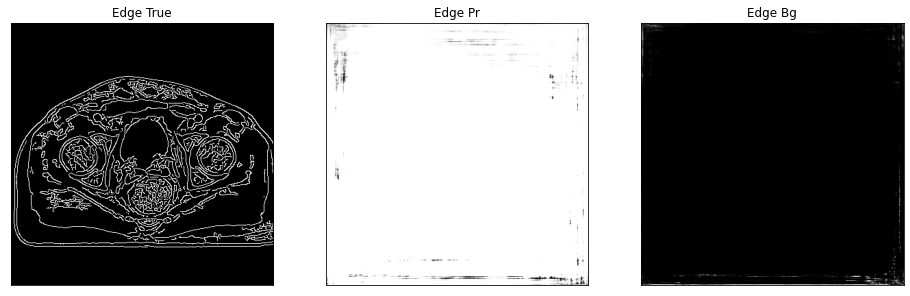

edge of ct_pred = 0.5780577659606934, edge of ct_true = 0.6131380796432495
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.8325e-23, device='cuda:0') tensor(1., device='cuda:0')


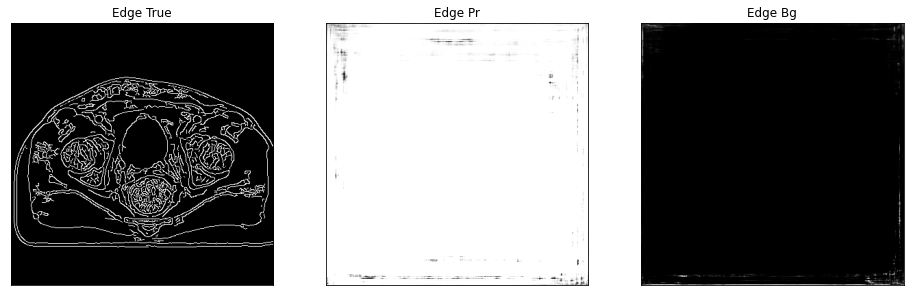

edge of ct_pred = 0.5783789157867432, edge of ct_true = 0.612153947353363
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.0254e-23, device='cuda:0') tensor(1., device='cuda:0')


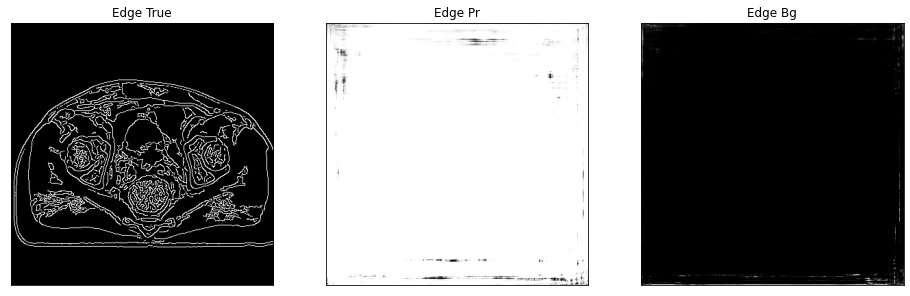

3it [00:09,  3.50s/it]

edge of ct_pred = 0.5784323811531067, edge of ct_true = 0.6148790717124939
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.4221e-23, device='cuda:0') tensor(1., device='cuda:0')


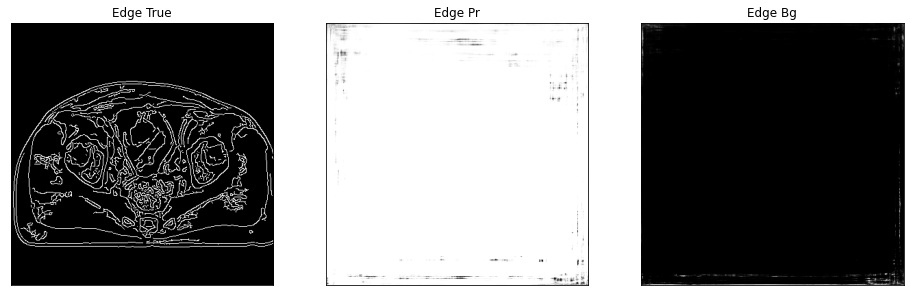

edge of ct_pred = 0.5786280632019043, edge of ct_true = 0.6136097311973572
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(7.7696e-24, device='cuda:0') tensor(1., device='cuda:0')


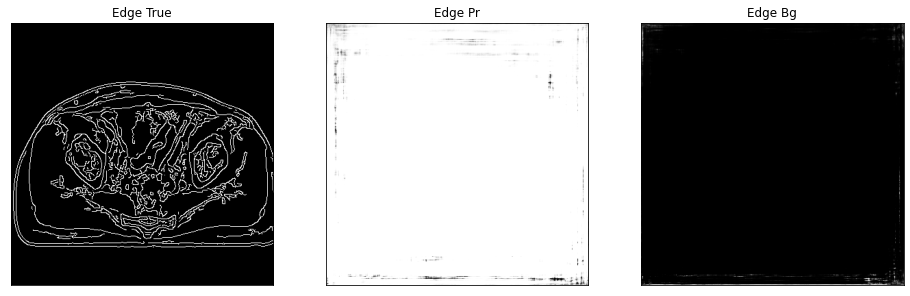

edge of ct_pred = 0.5784088373184204, edge of ct_true = 0.6130578517913818
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.7827e-23, device='cuda:0') tensor(1., device='cuda:0')


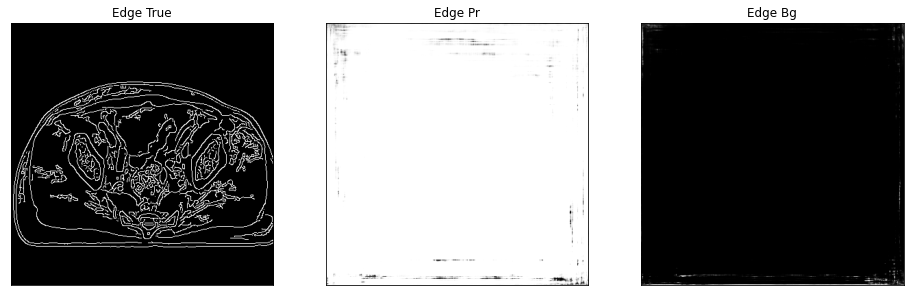

edge of ct_pred = 0.5782050490379333, edge of ct_true = 0.6131653189659119
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.7540e-24, device='cuda:0') tensor(1., device='cuda:0')


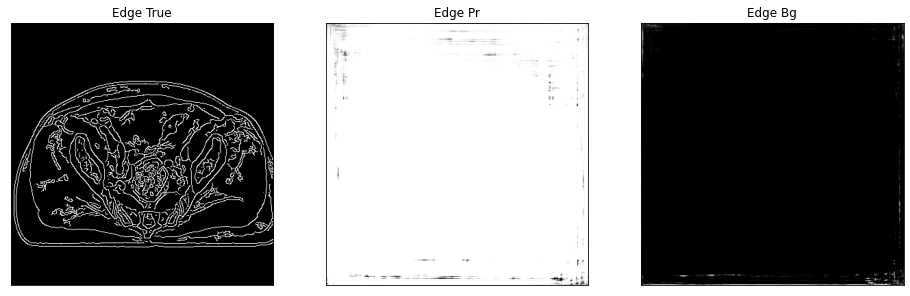

edge of ct_pred = 0.5780637264251709, edge of ct_true = 0.613094687461853
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.9175e-23, device='cuda:0') tensor(1., device='cuda:0')


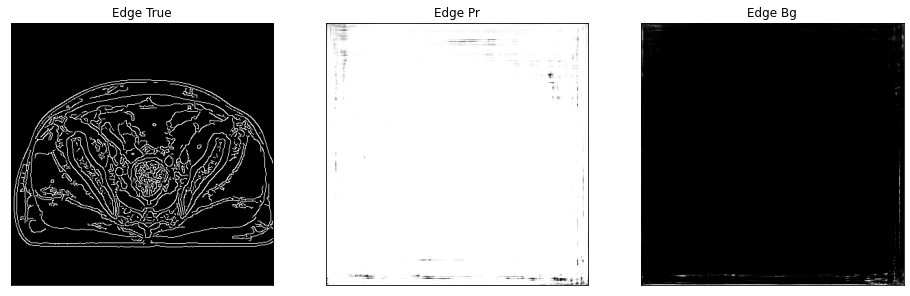

edge of ct_pred = 0.5783007144927979, edge of ct_true = 0.612298846244812
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.5301e-25, device='cuda:0') tensor(1., device='cuda:0')


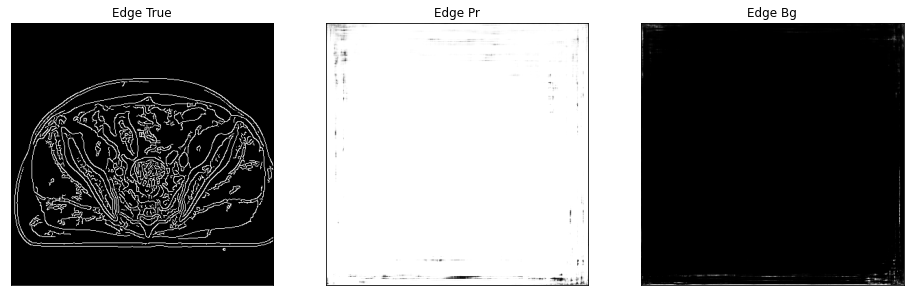

edge of ct_pred = 0.5786781311035156, edge of ct_true = 0.6110407710075378
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.9105e-26, device='cuda:0') tensor(1., device='cuda:0')


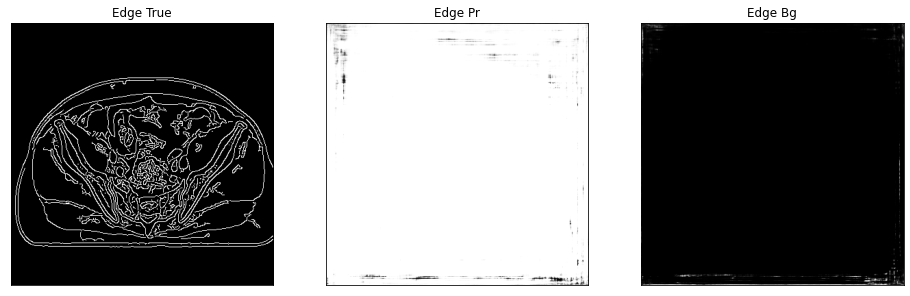

edge of ct_pred = 0.5778654217720032, edge of ct_true = 0.6179874539375305
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.9247e-24, device='cuda:0') tensor(1., device='cuda:0')


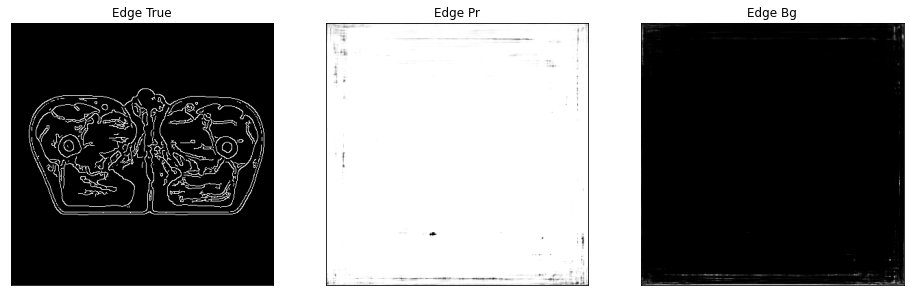

edge of ct_pred = 0.5776003003120422, edge of ct_true = 0.6184159517288208
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(5.8478e-25, device='cuda:0') tensor(1., device='cuda:0')


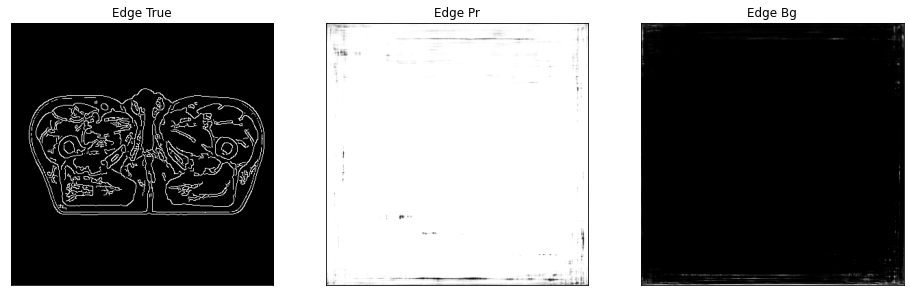

edge of ct_pred = 0.5776816606521606, edge of ct_true = 0.6187347769737244
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.1655e-25, device='cuda:0') tensor(1., device='cuda:0')


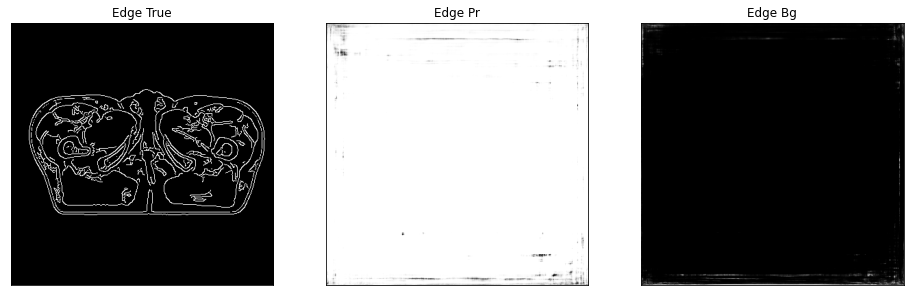

edge of ct_pred = 0.5775818228721619, edge of ct_true = 0.6186503767967224
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(5.2587e-24, device='cuda:0') tensor(1., device='cuda:0')


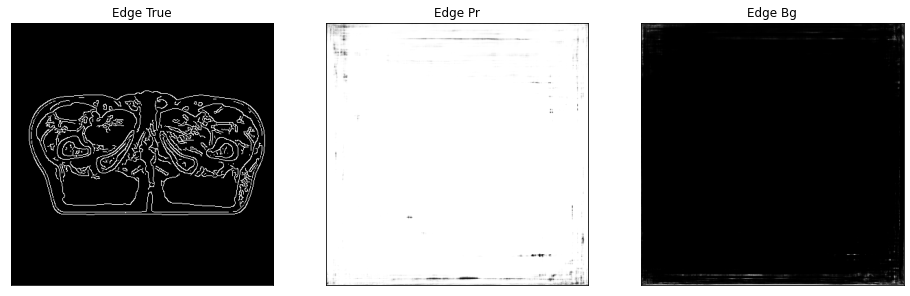

edge of ct_pred = 0.5775125622749329, edge of ct_true = 0.6192798614501953
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.4961e-24, device='cuda:0') tensor(1., device='cuda:0')


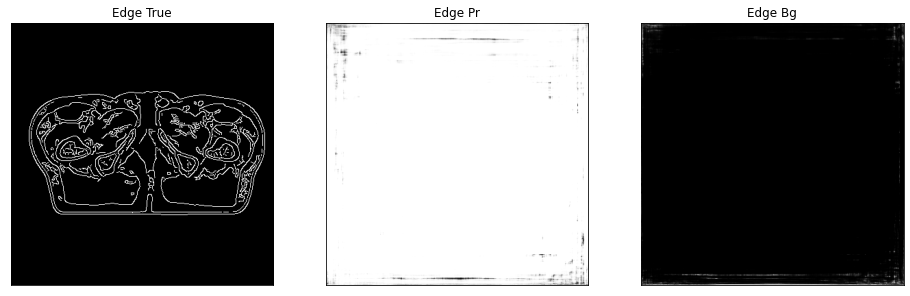

edge of ct_pred = 0.5777541399002075, edge of ct_true = 0.6188238859176636
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.6588e-24, device='cuda:0') tensor(1., device='cuda:0')


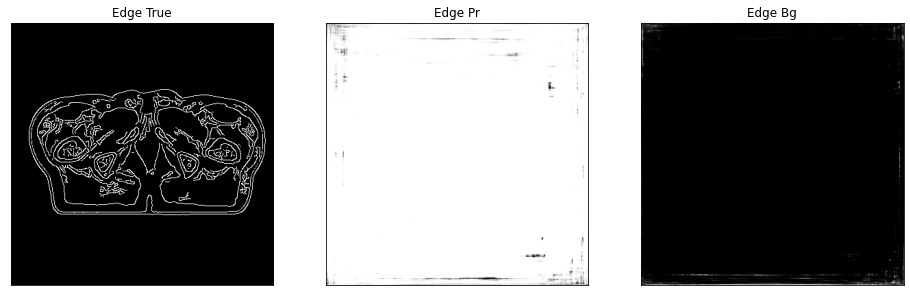

edge of ct_pred = 0.5780589580535889, edge of ct_true = 0.6179365515708923
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.6611e-25, device='cuda:0') tensor(1., device='cuda:0')


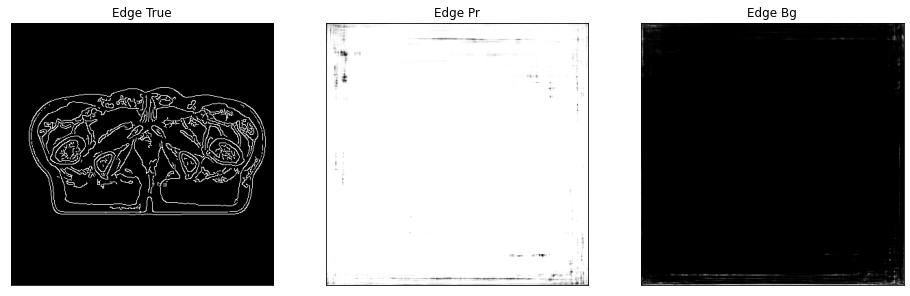

edge of ct_pred = 0.5778785943984985, edge of ct_true = 0.6183815598487854
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(5.1496e-24, device='cuda:0') tensor(1., device='cuda:0')


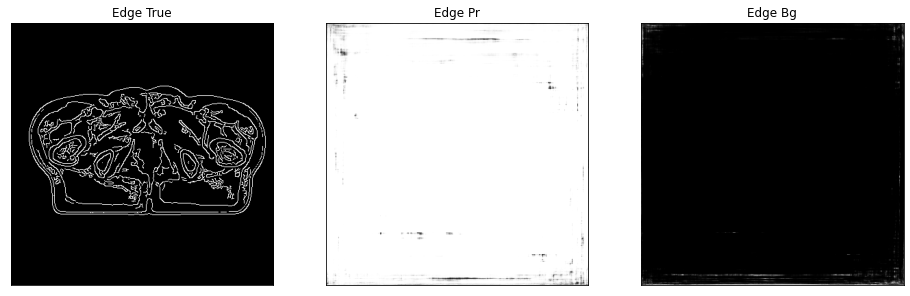

edge of ct_pred = 0.5776114463806152, edge of ct_true = 0.6182392835617065
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.6542e-24, device='cuda:0') tensor(1., device='cuda:0')


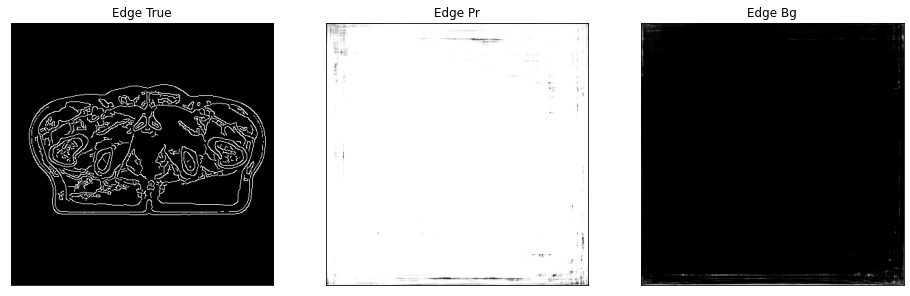

4it [00:12,  3.30s/it]

edge of ct_pred = 0.5781757831573486, edge of ct_true = 0.6181380152702332
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.7010e-24, device='cuda:0') tensor(1., device='cuda:0')


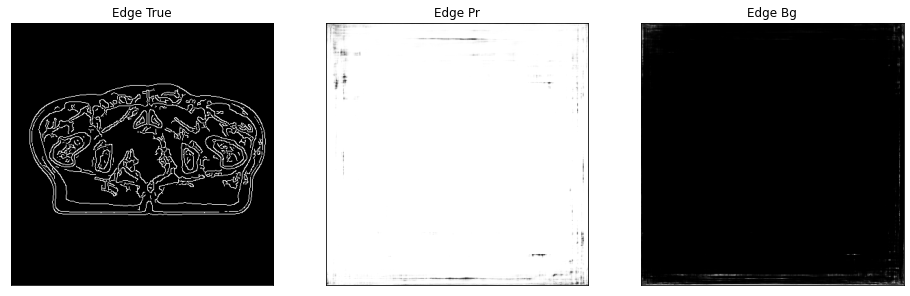

edge of ct_pred = 0.5779047608375549, edge of ct_true = 0.6160232424736023
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.4038e-24, device='cuda:0') tensor(1., device='cuda:0')


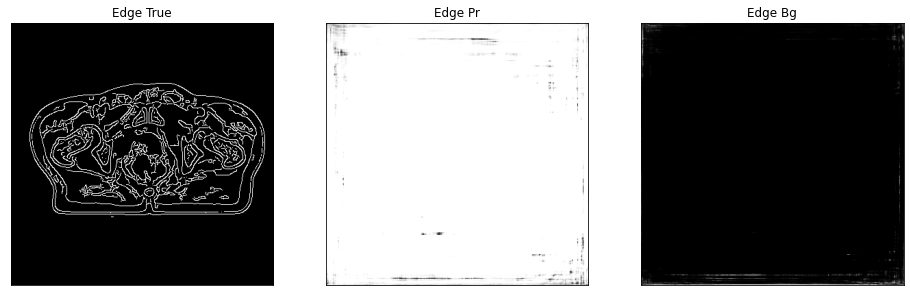

edge of ct_pred = 0.577923595905304, edge of ct_true = 0.6164181232452393
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(5.8947e-26, device='cuda:0') tensor(1., device='cuda:0')


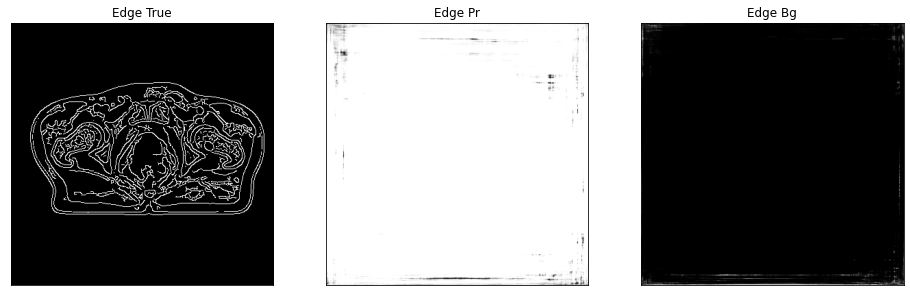

edge of ct_pred = 0.5779478549957275, edge of ct_true = 0.6176726818084717
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.2574e-25, device='cuda:0') tensor(1., device='cuda:0')


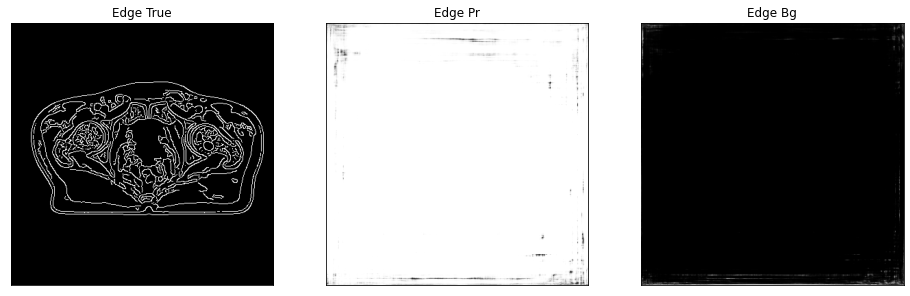

edge of ct_pred = 0.5777159929275513, edge of ct_true = 0.6158056259155273
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.8145e-24, device='cuda:0') tensor(1., device='cuda:0')


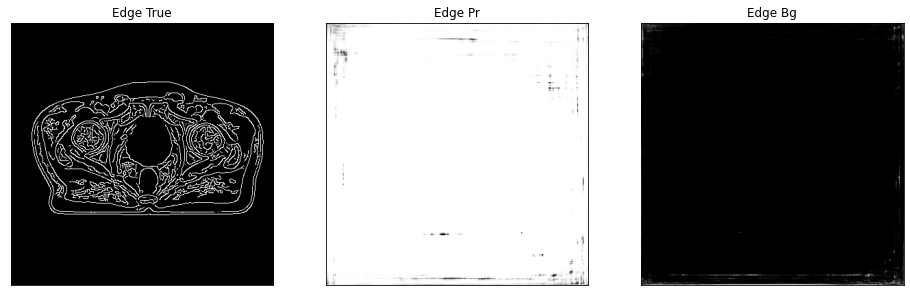

edge of ct_pred = 0.5779306292533875, edge of ct_true = 0.6167927980422974
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.6163e-25, device='cuda:0') tensor(1., device='cuda:0')


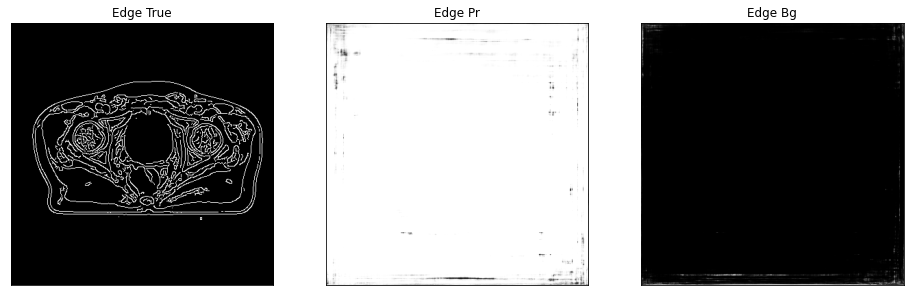

edge of ct_pred = 0.5781653523445129, edge of ct_true = 0.6178981065750122
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(5.1503e-24, device='cuda:0') tensor(1., device='cuda:0')


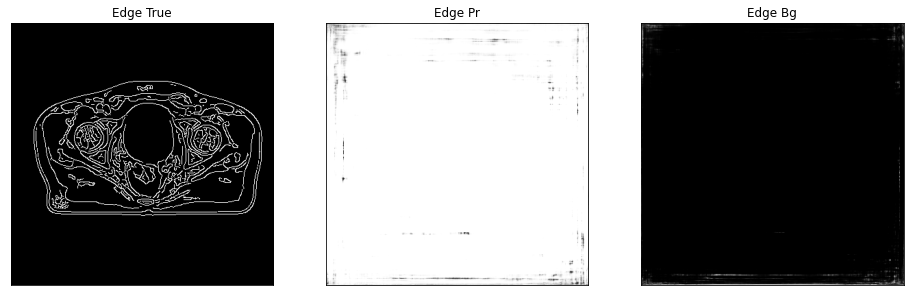

edge of ct_pred = 0.5784844756126404, edge of ct_true = 0.6183434724807739
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.0820e-25, device='cuda:0') tensor(1., device='cuda:0')


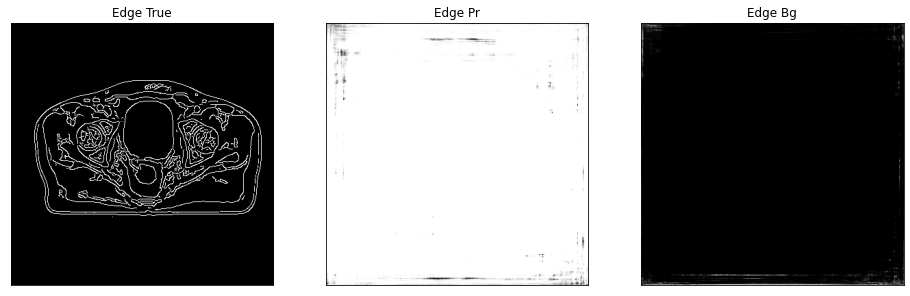

edge of ct_pred = 0.5781278014183044, edge of ct_true = 0.6182244420051575
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.7282e-23, device='cuda:0') tensor(1., device='cuda:0')


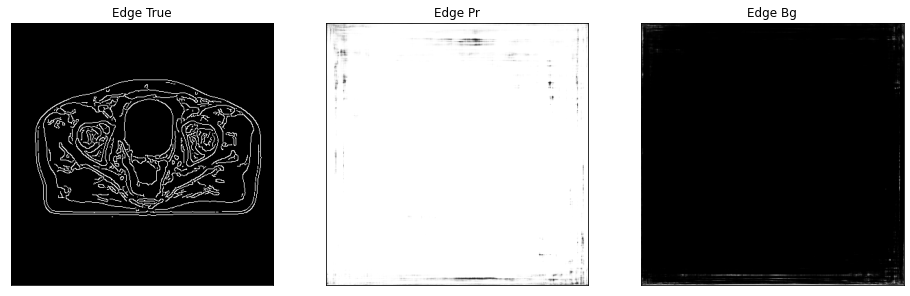

edge of ct_pred = 0.5783281326293945, edge of ct_true = 0.6176295280456543
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.6369e-23, device='cuda:0') tensor(1., device='cuda:0')


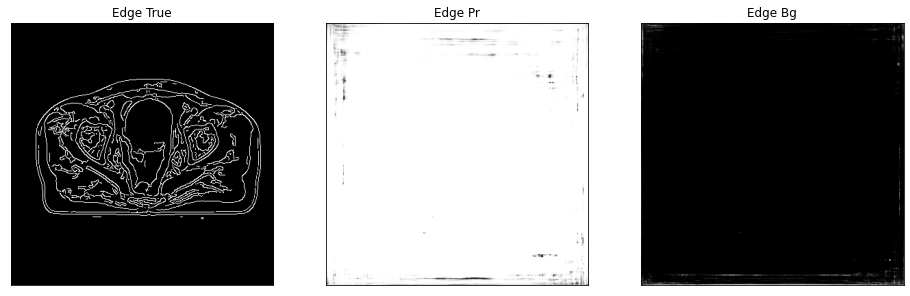

edge of ct_pred = 0.5781928300857544, edge of ct_true = 0.6180477142333984
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.2740e-24, device='cuda:0') tensor(1., device='cuda:0')


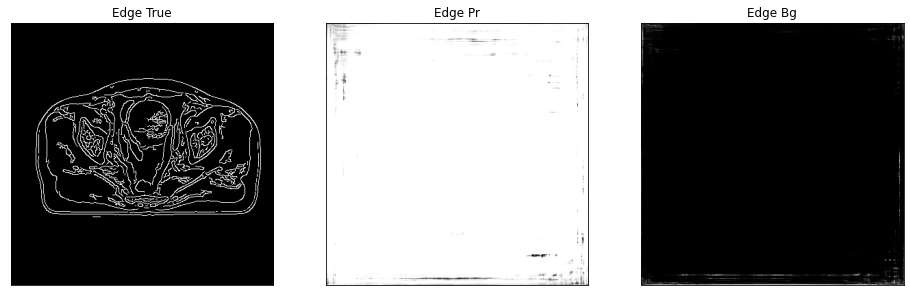

edge of ct_pred = 0.5786194205284119, edge of ct_true = 0.6177103519439697
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(5.8494e-24, device='cuda:0') tensor(1., device='cuda:0')


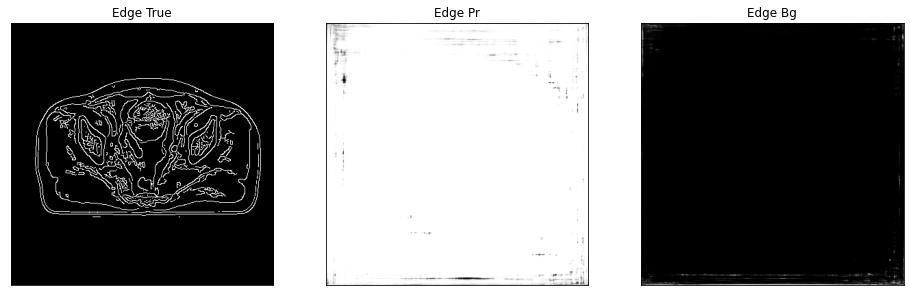

edge of ct_pred = 0.5780314803123474, edge of ct_true = 0.6170687675476074
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.2189e-25, device='cuda:0') tensor(1., device='cuda:0')


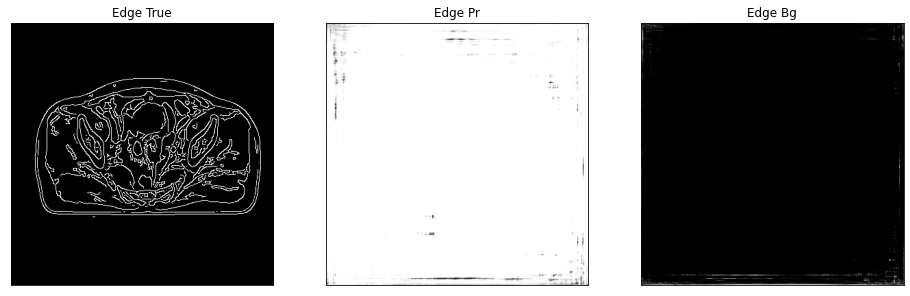

edge of ct_pred = 0.5784820318222046, edge of ct_true = 0.6155773401260376
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.2242e-26, device='cuda:0') tensor(1., device='cuda:0')


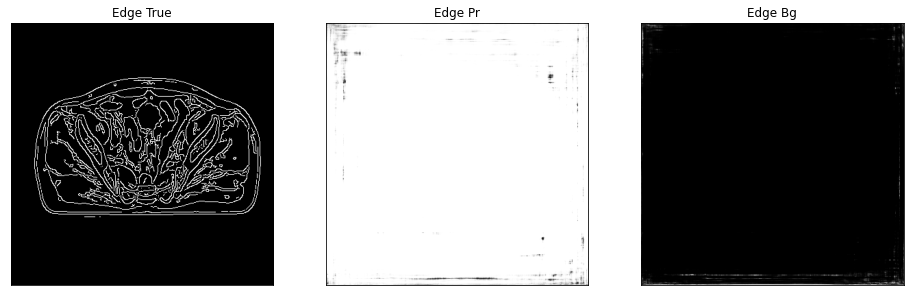

edge of ct_pred = 0.5781551599502563, edge of ct_true = 0.6139539480209351
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.3984e-26, device='cuda:0') tensor(1., device='cuda:0')


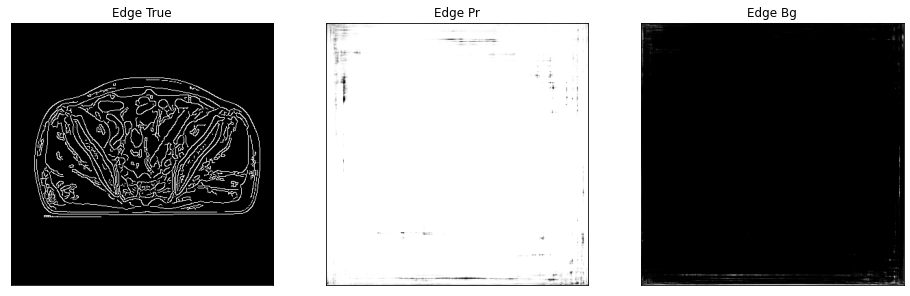

edge of ct_pred = 0.5783394575119019, edge of ct_true = 0.614646315574646
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.2790e-26, device='cuda:0') tensor(1., device='cuda:0')


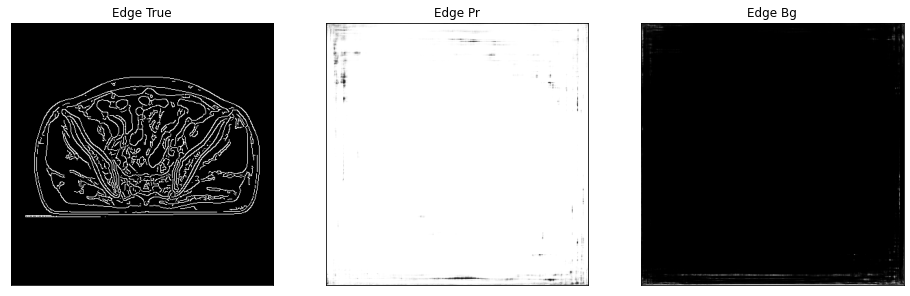

5it [00:15,  3.22s/it]

edge of ct_pred = 0.5785272717475891, edge of ct_true = 0.6141406893730164
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.2821e-24, device='cuda:0') tensor(1., device='cuda:0')


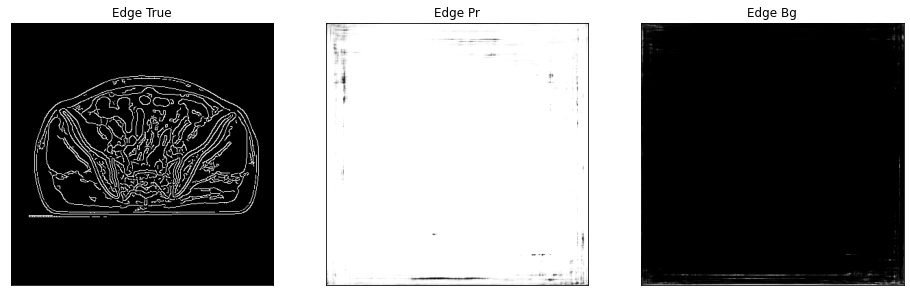

edge of ct_pred = 0.5772585272789001, edge of ct_true = 0.6183567643165588
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.5947e-23, device='cuda:0') tensor(1., device='cuda:0')


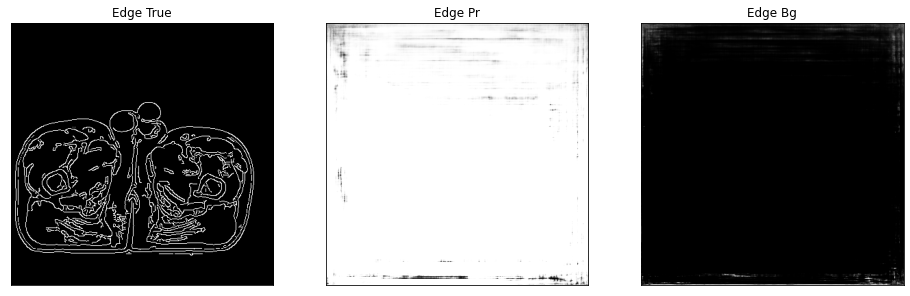

edge of ct_pred = 0.5769802927970886, edge of ct_true = 0.6193020939826965
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.4380e-23, device='cuda:0') tensor(1., device='cuda:0')


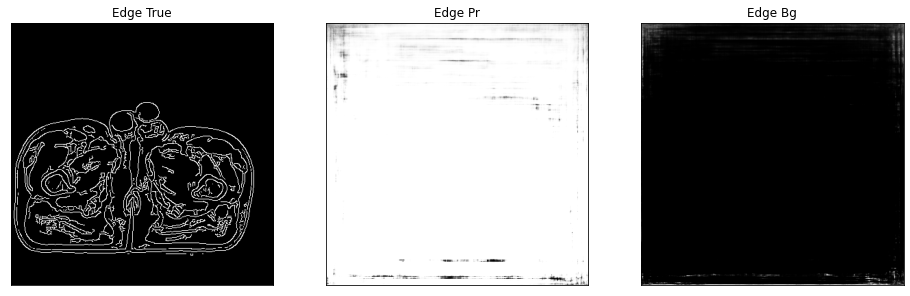

edge of ct_pred = 0.5770599842071533, edge of ct_true = 0.6180106997489929
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(9.4472e-24, device='cuda:0') tensor(1., device='cuda:0')


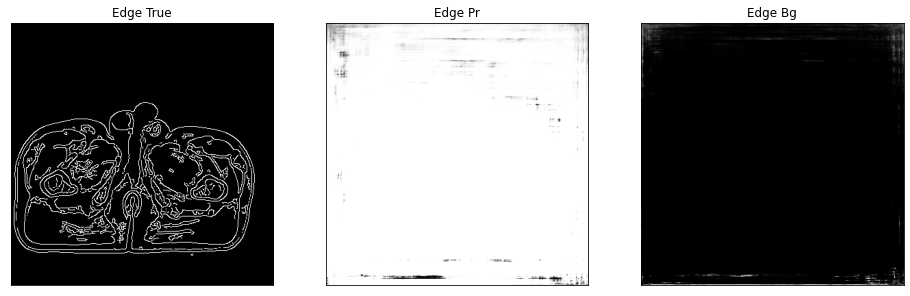

edge of ct_pred = 0.5773105025291443, edge of ct_true = 0.6180894374847412
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.2627e-24, device='cuda:0') tensor(1., device='cuda:0')


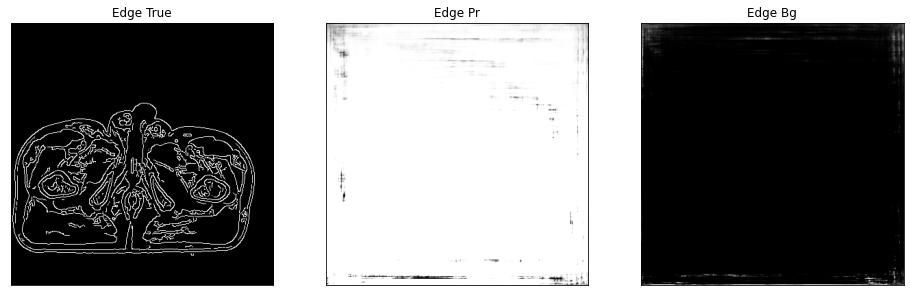

edge of ct_pred = 0.5770344138145447, edge of ct_true = 0.6178267598152161
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.0804e-24, device='cuda:0') tensor(1., device='cuda:0')


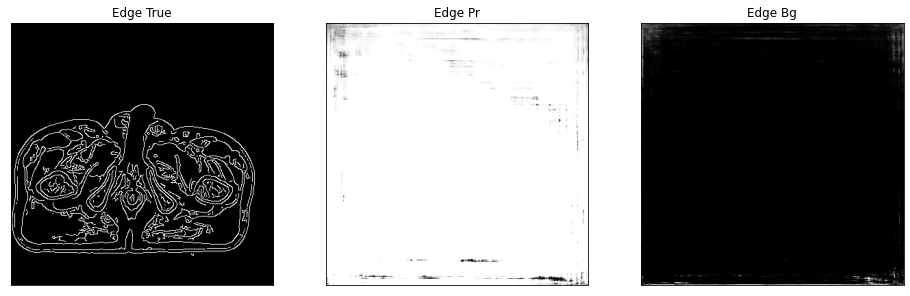

edge of ct_pred = 0.5771957039833069, edge of ct_true = 0.617497444152832
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.5175e-27, device='cuda:0') tensor(1., device='cuda:0')


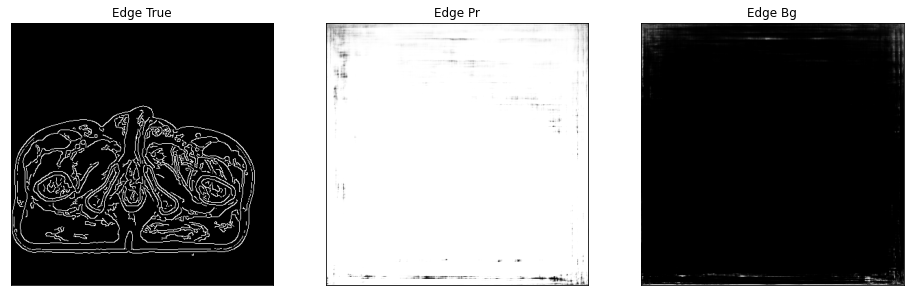

edge of ct_pred = 0.5773234367370605, edge of ct_true = 0.6164116263389587
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.6837e-25, device='cuda:0') tensor(1., device='cuda:0')


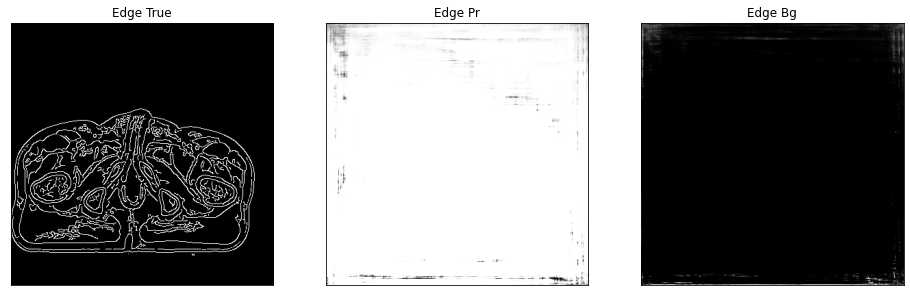

edge of ct_pred = 0.5769336819648743, edge of ct_true = 0.6166486144065857
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(7.7473e-26, device='cuda:0') tensor(1., device='cuda:0')


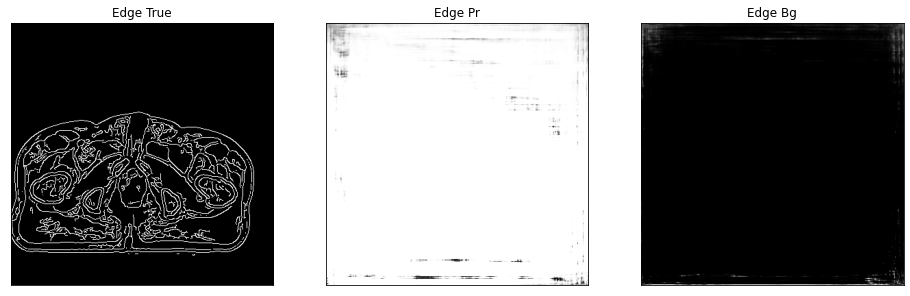

edge of ct_pred = 0.5771236419677734, edge of ct_true = 0.6165974736213684
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.1938e-23, device='cuda:0') tensor(1., device='cuda:0')


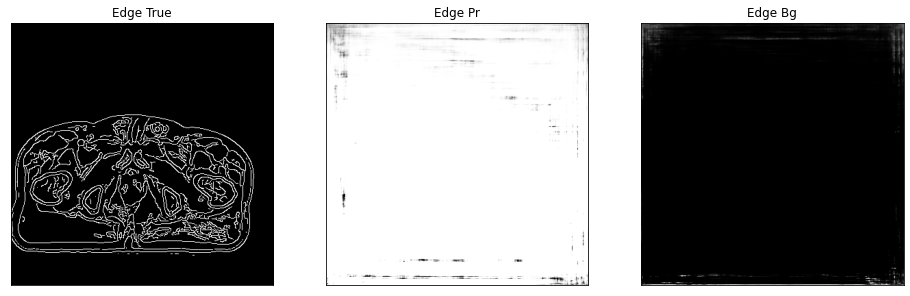

edge of ct_pred = 0.5771199464797974, edge of ct_true = 0.6176382303237915
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.6493e-26, device='cuda:0') tensor(1., device='cuda:0')


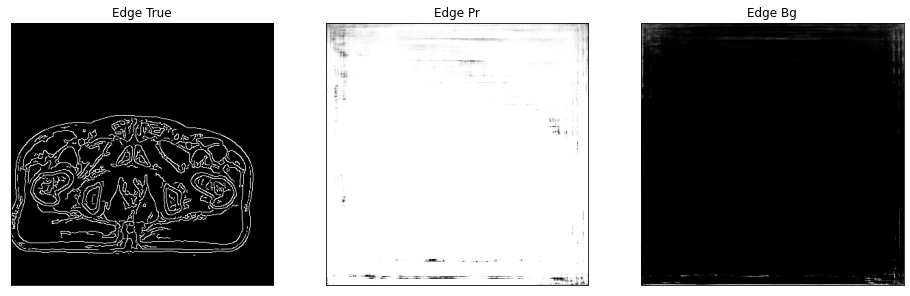

edge of ct_pred = 0.5770959854125977, edge of ct_true = 0.6170119643211365
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.0327e-24, device='cuda:0') tensor(1., device='cuda:0')


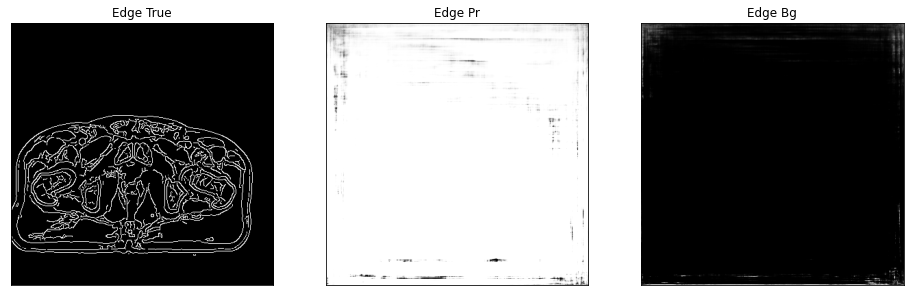

edge of ct_pred = 0.5769125819206238, edge of ct_true = 0.6168060302734375
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.7945e-25, device='cuda:0') tensor(1., device='cuda:0')


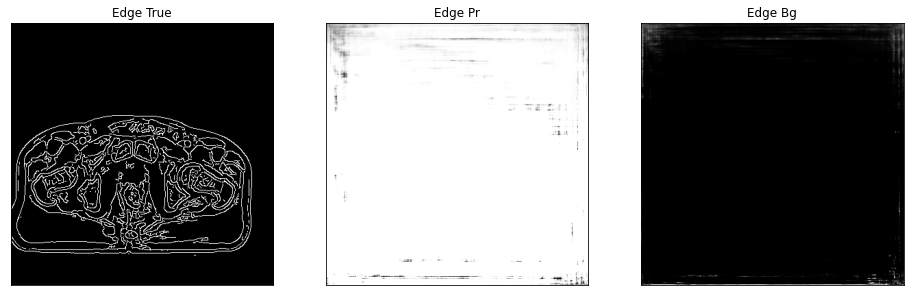

edge of ct_pred = 0.5771235227584839, edge of ct_true = 0.6161893606185913
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(5.8510e-24, device='cuda:0') tensor(1., device='cuda:0')


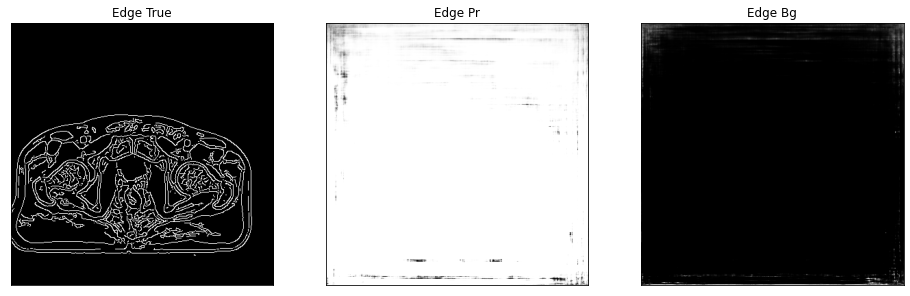

edge of ct_pred = 0.5770004391670227, edge of ct_true = 0.6167954206466675
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.3734e-25, device='cuda:0') tensor(1., device='cuda:0')


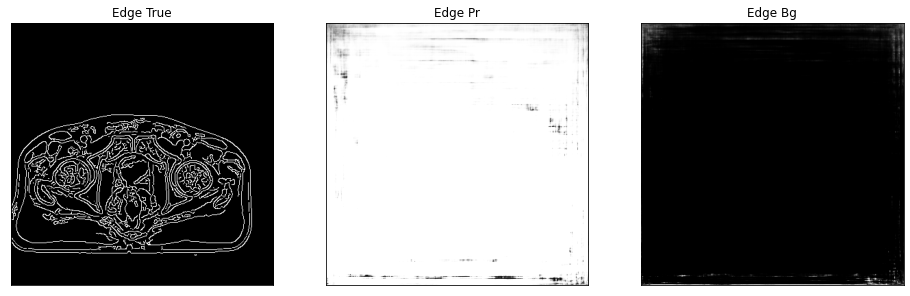

edge of ct_pred = 0.5772250890731812, edge of ct_true = 0.6165664196014404
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(9.9267e-26, device='cuda:0') tensor(1., device='cuda:0')


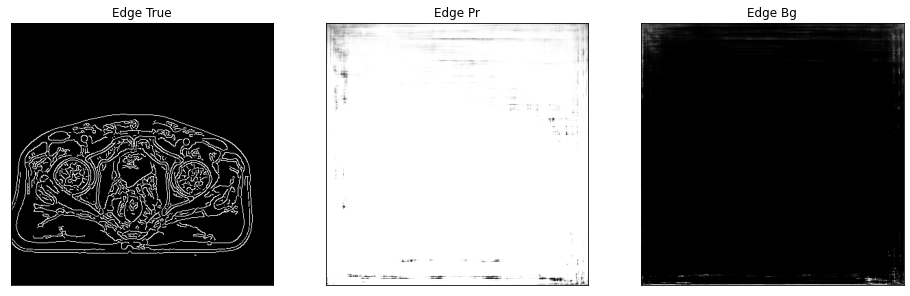

6it [00:18,  3.11s/it]

edge of ct_pred = 0.5770242810249329, edge of ct_true = 0.6165993809700012
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.2884e-24, device='cuda:0') tensor(1., device='cuda:0')


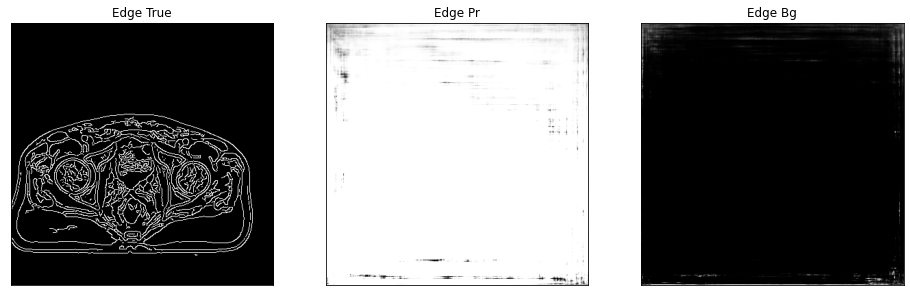

edge of ct_pred = 0.5769045948982239, edge of ct_true = 0.6169017553329468
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.4343e-24, device='cuda:0') tensor(1., device='cuda:0')


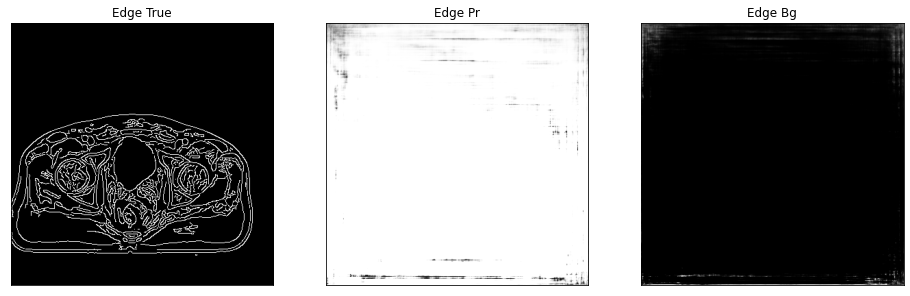

edge of ct_pred = 0.5770926475524902, edge of ct_true = 0.6161669492721558
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(7.5691e-26, device='cuda:0') tensor(1., device='cuda:0')


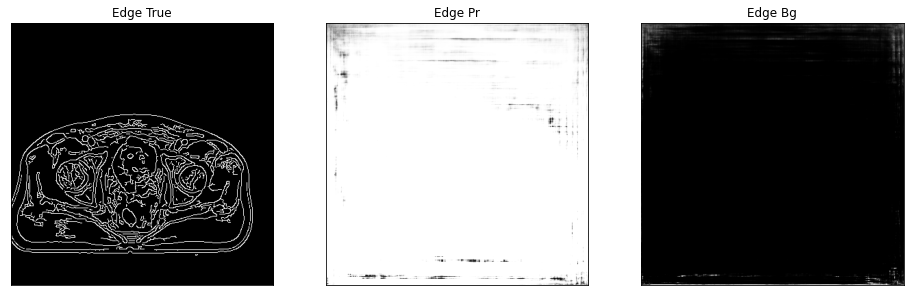

edge of ct_pred = 0.5772421956062317, edge of ct_true = 0.6179727911949158
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.3883e-24, device='cuda:0') tensor(1., device='cuda:0')


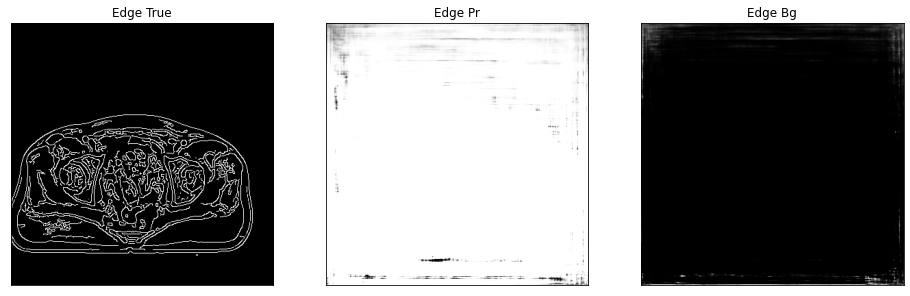

edge of ct_pred = 0.5771558880805969, edge of ct_true = 0.6183168888092041
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.7078e-25, device='cuda:0') tensor(1., device='cuda:0')


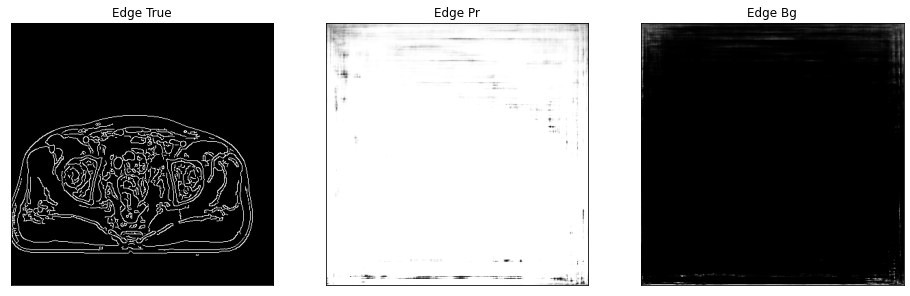

edge of ct_pred = 0.5772389769554138, edge of ct_true = 0.6177980899810791
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.4902e-24, device='cuda:0') tensor(1., device='cuda:0')


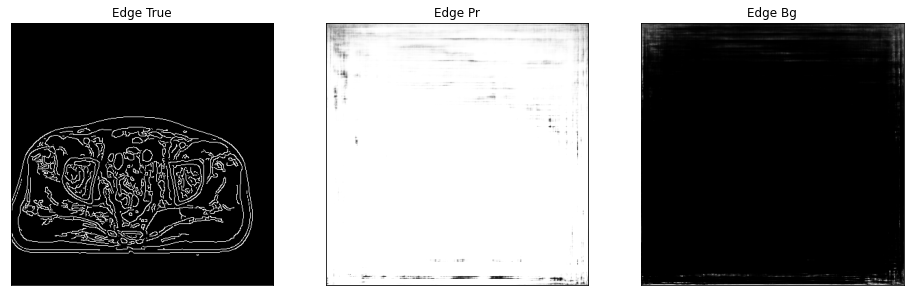

edge of ct_pred = 0.577466607093811, edge of ct_true = 0.6174961924552917
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.1654e-23, device='cuda:0') tensor(1., device='cuda:0')


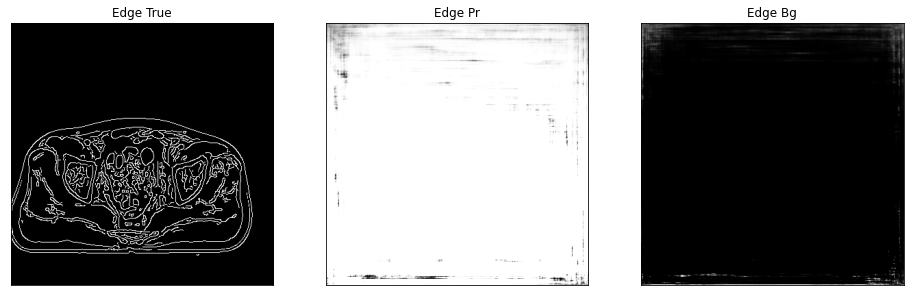

edge of ct_pred = 0.5771234631538391, edge of ct_true = 0.6182047724723816
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.6012e-24, device='cuda:0') tensor(1., device='cuda:0')


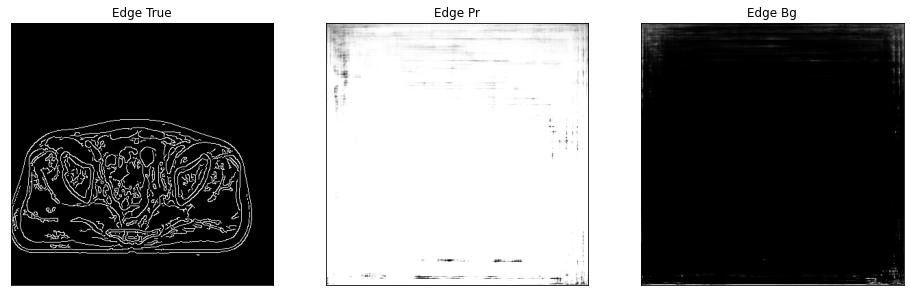

edge of ct_pred = 0.5774605870246887, edge of ct_true = 0.6181161999702454
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.6179e-25, device='cuda:0') tensor(1., device='cuda:0')


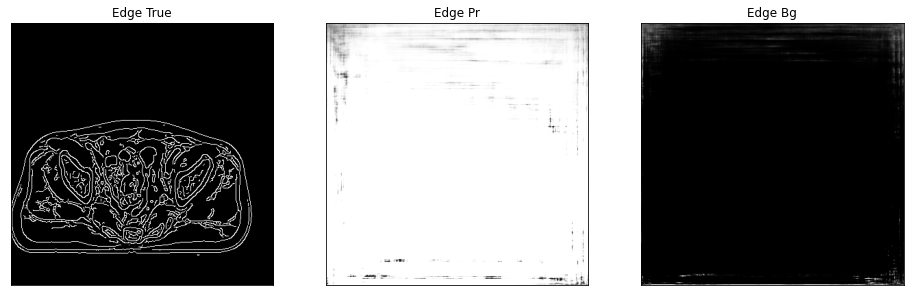

edge of ct_pred = 0.5773442983627319, edge of ct_true = 0.6164237856864929
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(8.9801e-26, device='cuda:0') tensor(1., device='cuda:0')


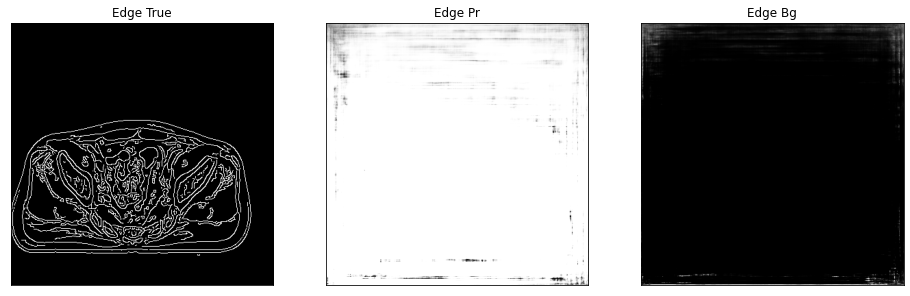

edge of ct_pred = 0.5772091746330261, edge of ct_true = 0.6165482997894287
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.2313e-24, device='cuda:0') tensor(1., device='cuda:0')


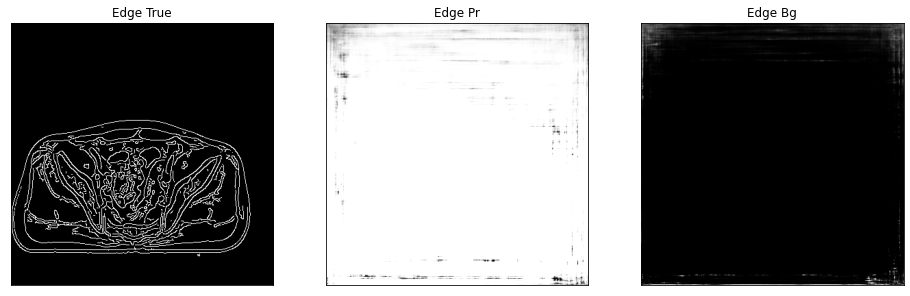

edge of ct_pred = 0.5773434042930603, edge of ct_true = 0.6155591011047363
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(7.2295e-26, device='cuda:0') tensor(1., device='cuda:0')


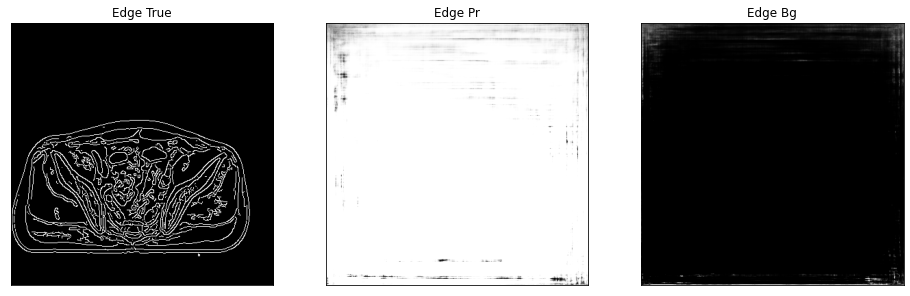

edge of ct_pred = 0.5771767497062683, edge of ct_true = 0.6170298457145691
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.3220e-26, device='cuda:0') tensor(1., device='cuda:0')


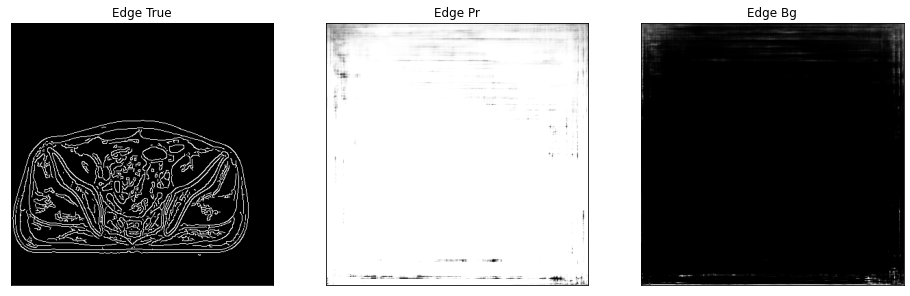

edge of ct_pred = 0.579753577709198, edge of ct_true = 0.6140034794807434
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.6676e-26, device='cuda:0') tensor(1., device='cuda:0')


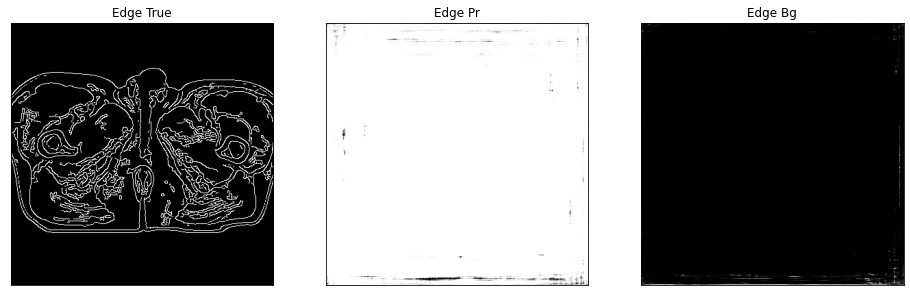

edge of ct_pred = 0.5795797109603882, edge of ct_true = 0.6136363744735718
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(5.9516e-24, device='cuda:0') tensor(1., device='cuda:0')


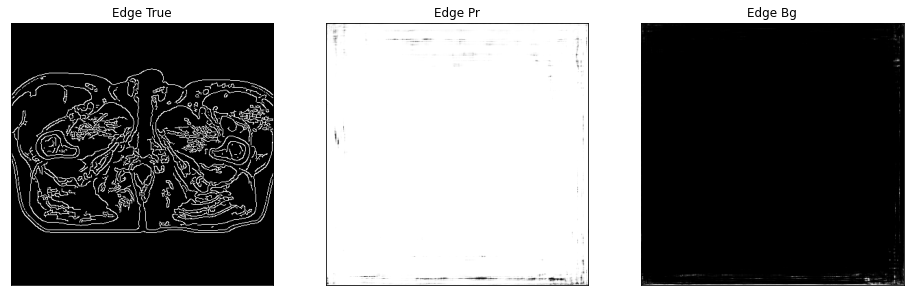

edge of ct_pred = 0.5790203809738159, edge of ct_true = 0.6144960522651672
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.1266e-24, device='cuda:0') tensor(1., device='cuda:0')


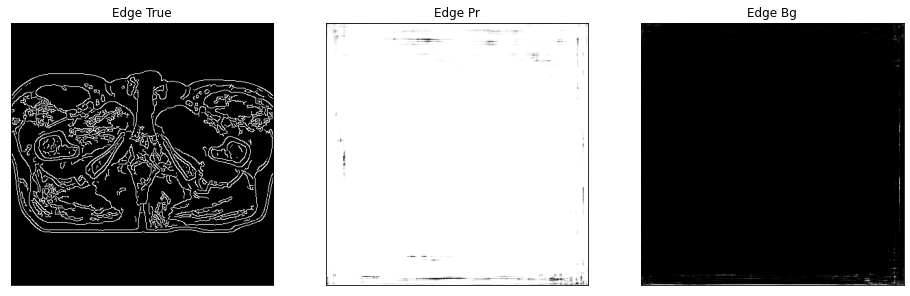

7it [00:21,  3.09s/it]

edge of ct_pred = 0.5789332389831543, edge of ct_true = 0.6142284870147705
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.2629e-27, device='cuda:0') tensor(1., device='cuda:0')


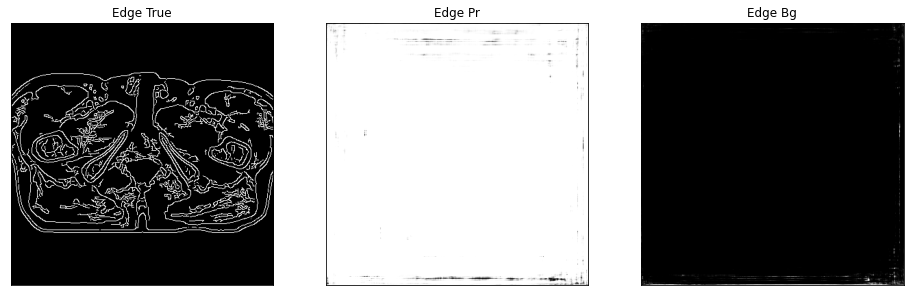

edge of ct_pred = 0.5798466801643372, edge of ct_true = 0.6140604019165039
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.2346e-23, device='cuda:0') tensor(1., device='cuda:0')


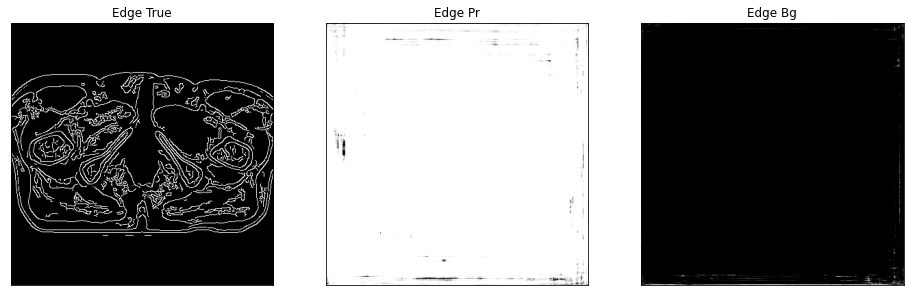

edge of ct_pred = 0.5795331597328186, edge of ct_true = 0.6163711547851562
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(8.1283e-25, device='cuda:0') tensor(1., device='cuda:0')


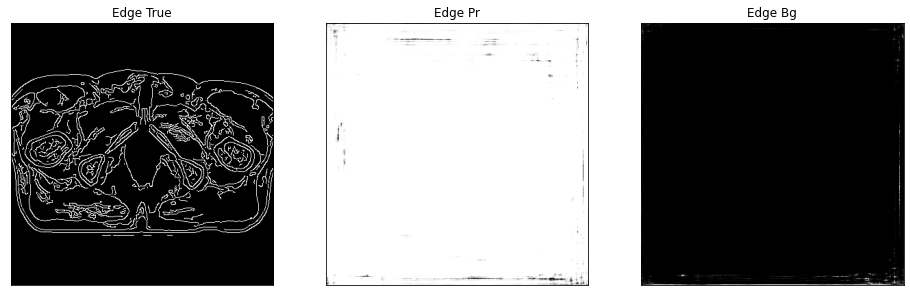

edge of ct_pred = 0.5798004865646362, edge of ct_true = 0.6144781708717346
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(5.2585e-25, device='cuda:0') tensor(1., device='cuda:0')


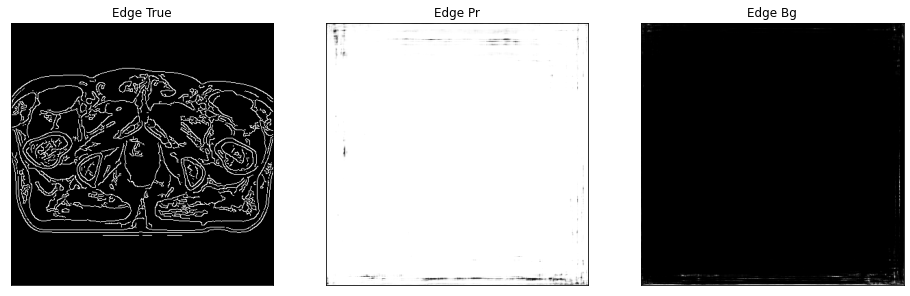

edge of ct_pred = 0.5793298482894897, edge of ct_true = 0.6128309965133667
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.0836e-26, device='cuda:0') tensor(1., device='cuda:0')


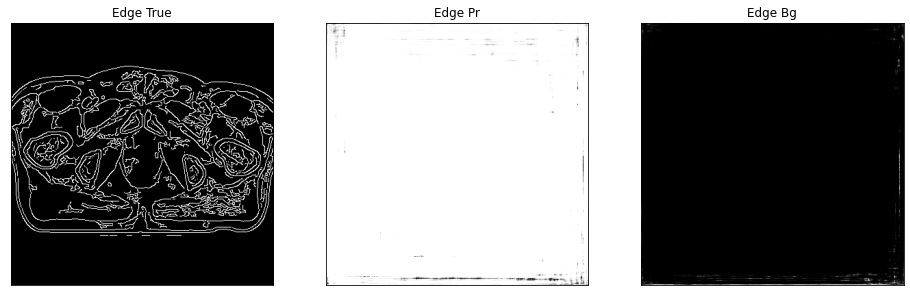

edge of ct_pred = 0.5793785452842712, edge of ct_true = 0.6160119771957397
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(8.4329e-25, device='cuda:0') tensor(1., device='cuda:0')


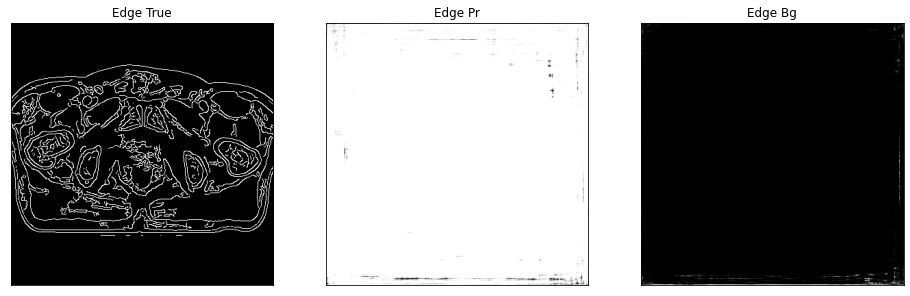

edge of ct_pred = 0.579666256904602, edge of ct_true = 0.6131204962730408
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.1814e-26, device='cuda:0') tensor(1., device='cuda:0')


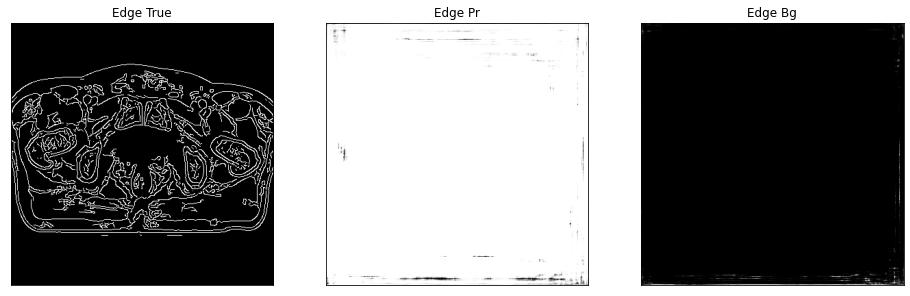

edge of ct_pred = 0.579497754573822, edge of ct_true = 0.6122460961341858
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.2774e-24, device='cuda:0') tensor(1., device='cuda:0')


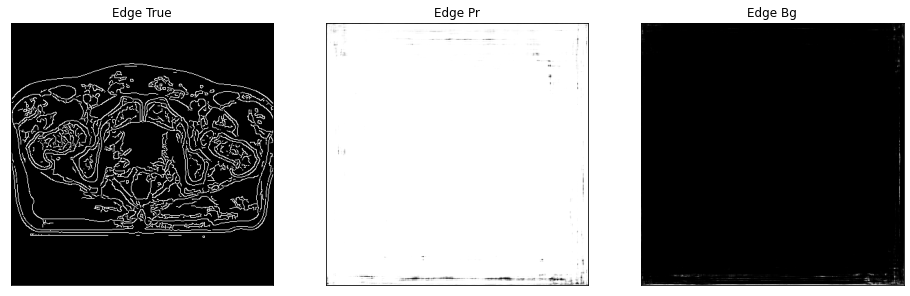

edge of ct_pred = 0.5788372755050659, edge of ct_true = 0.6103134155273438
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.2195e-26, device='cuda:0') tensor(1., device='cuda:0')


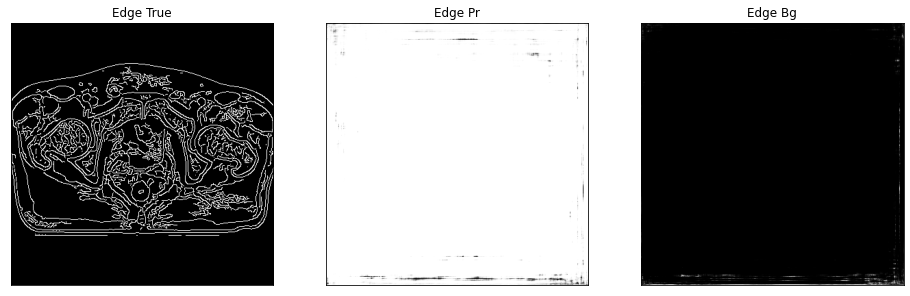

edge of ct_pred = 0.5795040726661682, edge of ct_true = 0.6132013201713562
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.4431e-26, device='cuda:0') tensor(1., device='cuda:0')


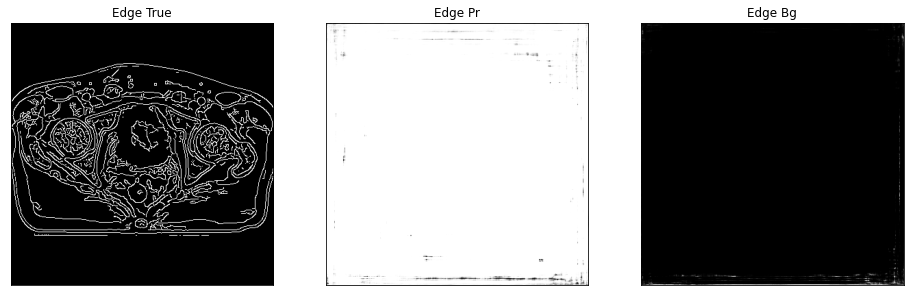

edge of ct_pred = 0.5784227848052979, edge of ct_true = 0.6111342906951904
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.6910e-25, device='cuda:0') tensor(1., device='cuda:0')


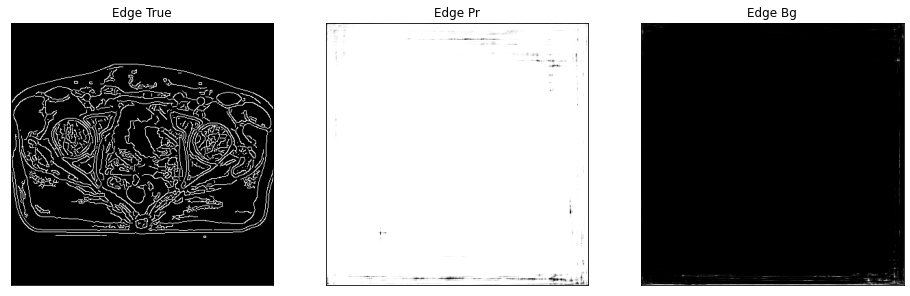

edge of ct_pred = 0.5794224739074707, edge of ct_true = 0.610872745513916
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.9440e-24, device='cuda:0') tensor(1., device='cuda:0')


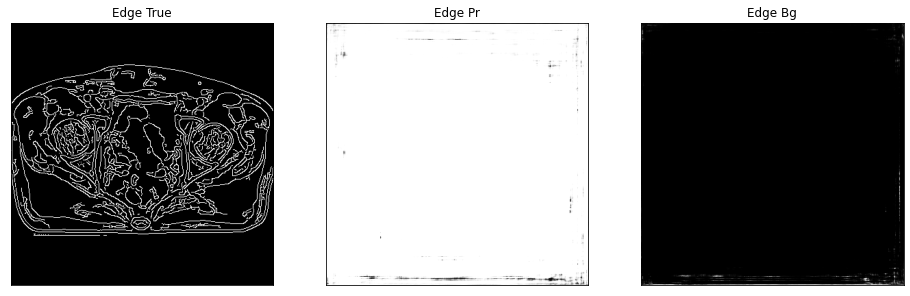

edge of ct_pred = 0.5790662169456482, edge of ct_true = 0.612906277179718
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.2040e-24, device='cuda:0') tensor(1., device='cuda:0')


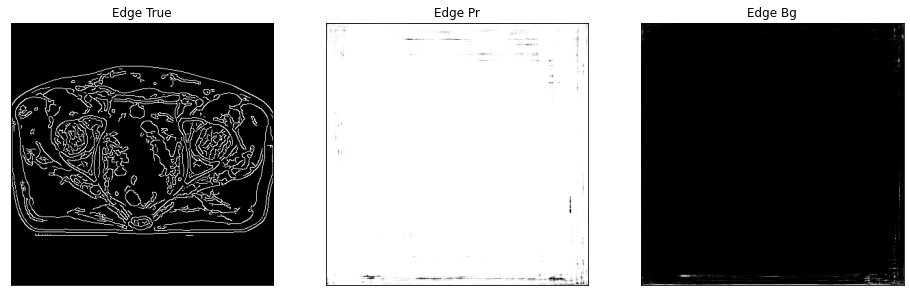

edge of ct_pred = 0.5790346264839172, edge of ct_true = 0.6121843457221985
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.4618e-25, device='cuda:0') tensor(1., device='cuda:0')


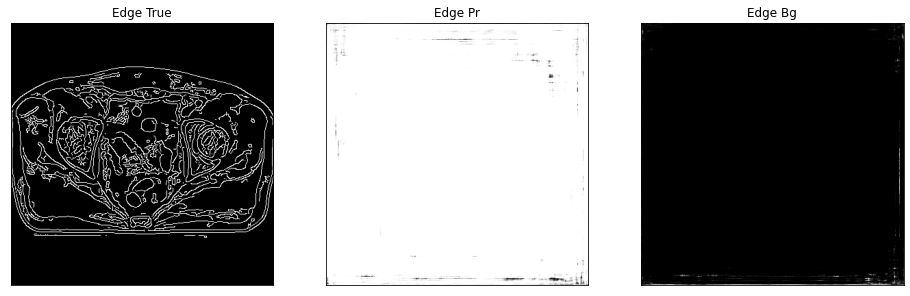

edge of ct_pred = 0.579497218132019, edge of ct_true = 0.611393928527832
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(9.9043e-25, device='cuda:0') tensor(1., device='cuda:0')


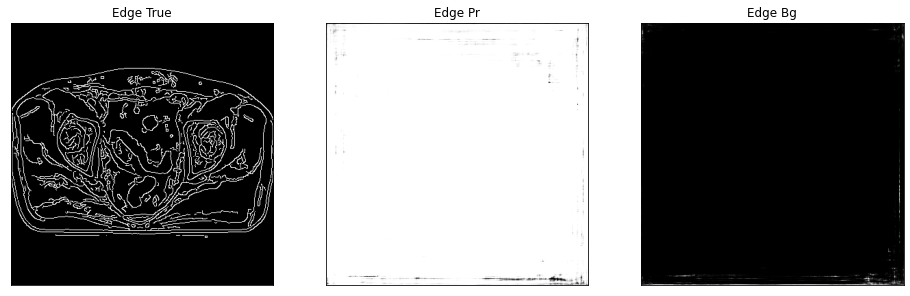

edge of ct_pred = 0.5792550444602966, edge of ct_true = 0.6121858954429626
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.3023e-25, device='cuda:0') tensor(1., device='cuda:0')


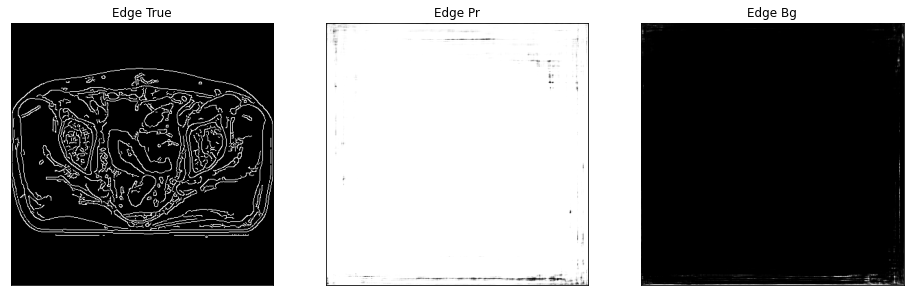

8it [00:24,  3.03s/it]

edge of ct_pred = 0.579796552658081, edge of ct_true = 0.612186074256897
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.0216e-24, device='cuda:0') tensor(1., device='cuda:0')


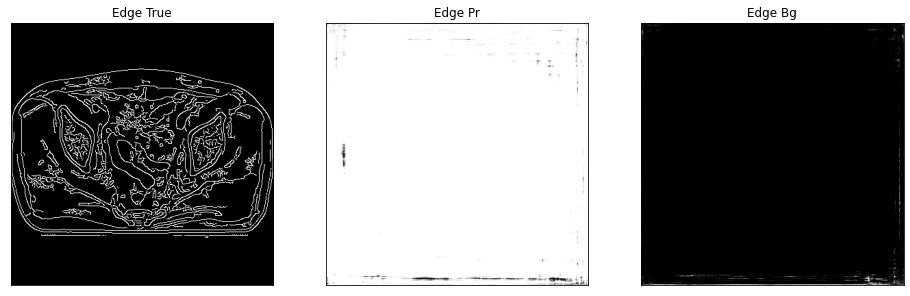

edge of ct_pred = 0.5794020295143127, edge of ct_true = 0.6111998558044434
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.3488e-27, device='cuda:0') tensor(1., device='cuda:0')


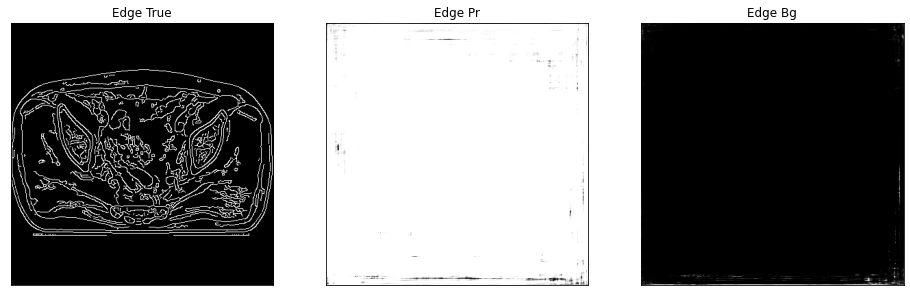

edge of ct_pred = 0.5794562101364136, edge of ct_true = 0.6130277514457703
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.1207e-25, device='cuda:0') tensor(1., device='cuda:0')


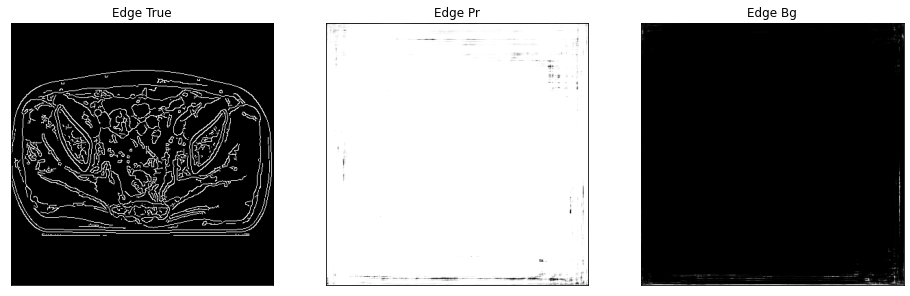

edge of ct_pred = 0.5792049765586853, edge of ct_true = 0.6129637956619263
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.3589e-25, device='cuda:0') tensor(1., device='cuda:0')


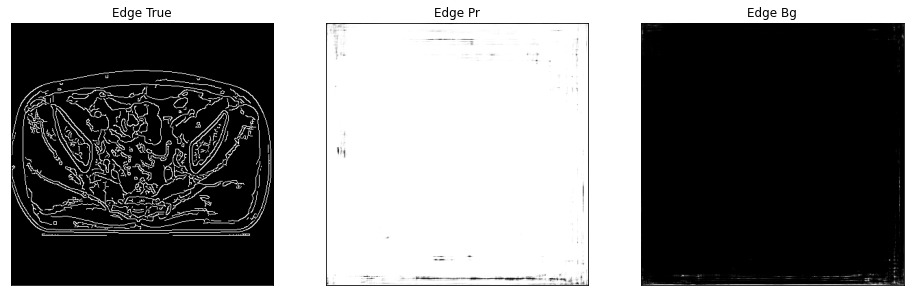

edge of ct_pred = 0.5796318054199219, edge of ct_true = 0.6124704480171204
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.3972e-26, device='cuda:0') tensor(1., device='cuda:0')


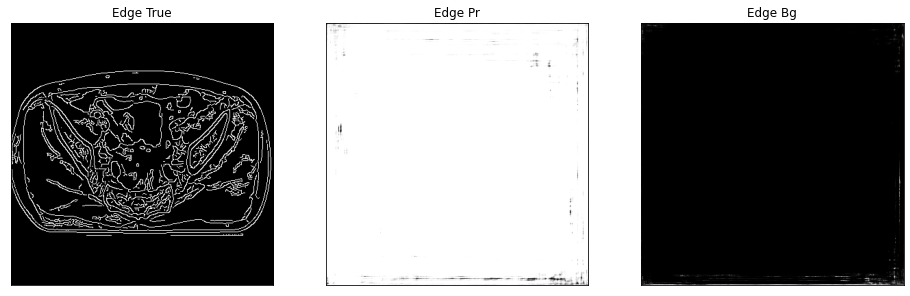

edge of ct_pred = 0.5795056819915771, edge of ct_true = 0.6119257807731628
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.0929e-24, device='cuda:0') tensor(1., device='cuda:0')


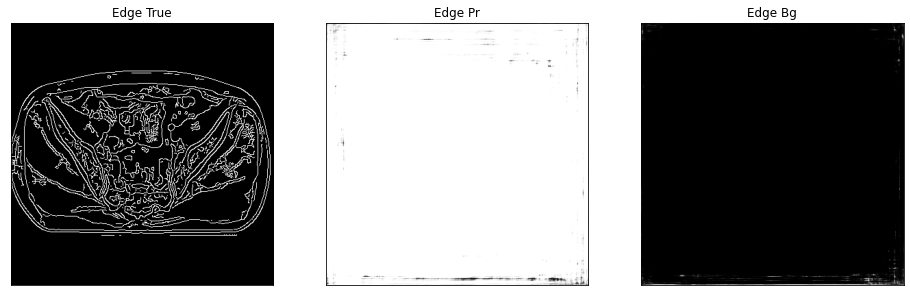

edge of ct_pred = 0.579425573348999, edge of ct_true = 0.6111508011817932
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.7214e-24, device='cuda:0') tensor(1., device='cuda:0')


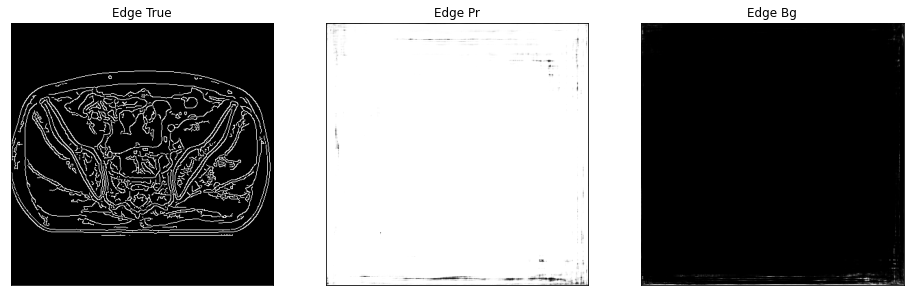

edge of ct_pred = 0.5794183611869812, edge of ct_true = 0.6115494966506958
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.7202e-25, device='cuda:0') tensor(1., device='cuda:0')


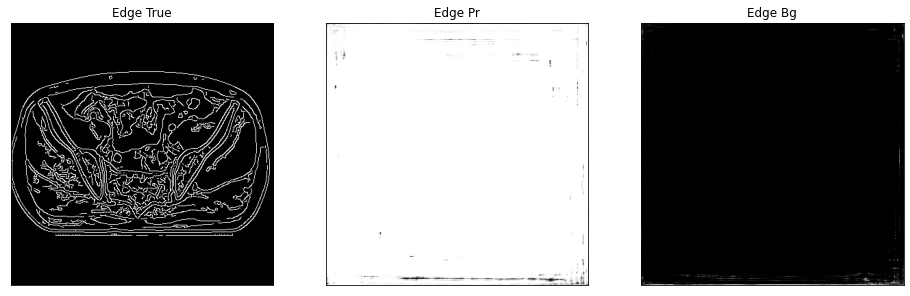

edge of ct_pred = 0.5793828964233398, edge of ct_true = 0.6171652674674988
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.4054e-25, device='cuda:0') tensor(1., device='cuda:0')


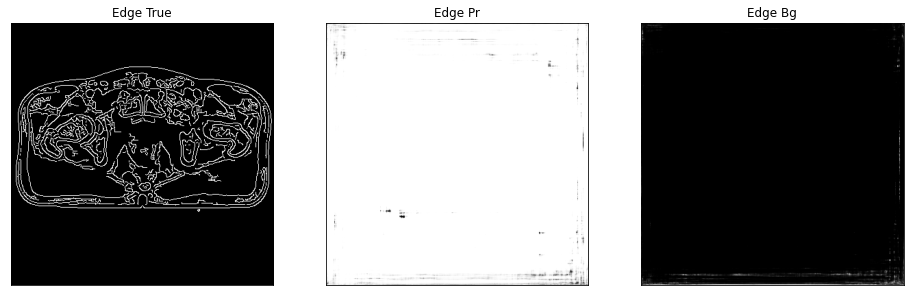

edge of ct_pred = 0.5794007182121277, edge of ct_true = 0.615734875202179
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.2047e-24, device='cuda:0') tensor(1., device='cuda:0')


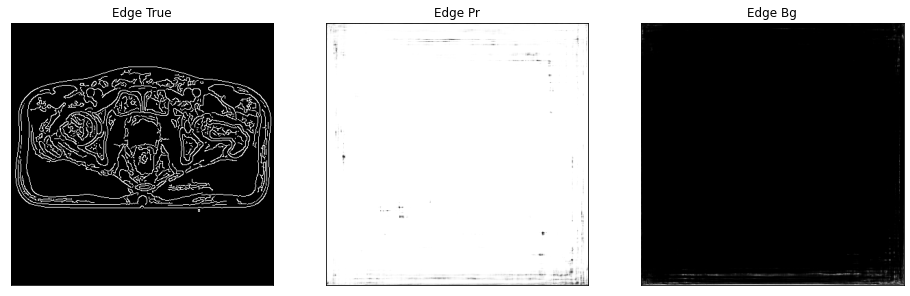

edge of ct_pred = 0.5787298679351807, edge of ct_true = 0.6165014505386353
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(5.0193e-28, device='cuda:0') tensor(1., device='cuda:0')


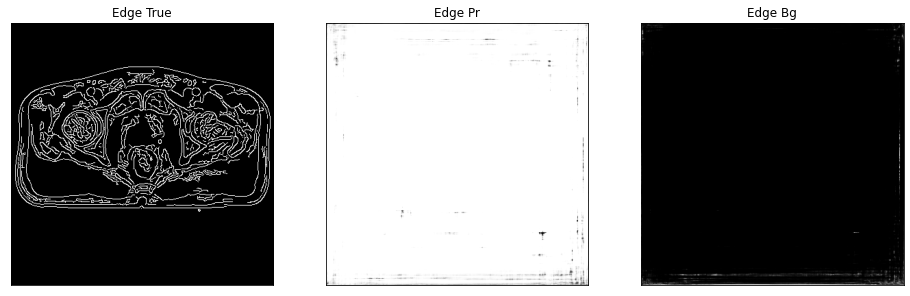

edge of ct_pred = 0.5792269110679626, edge of ct_true = 0.6165469288825989
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.7209e-25, device='cuda:0') tensor(1., device='cuda:0')


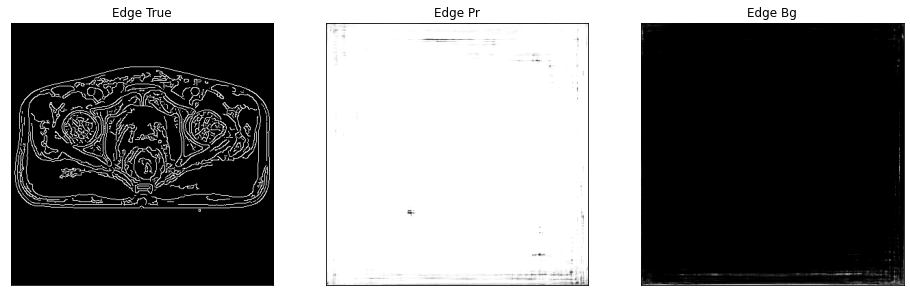

edge of ct_pred = 0.5788652300834656, edge of ct_true = 0.6173666715621948
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.1122e-25, device='cuda:0') tensor(1., device='cuda:0')


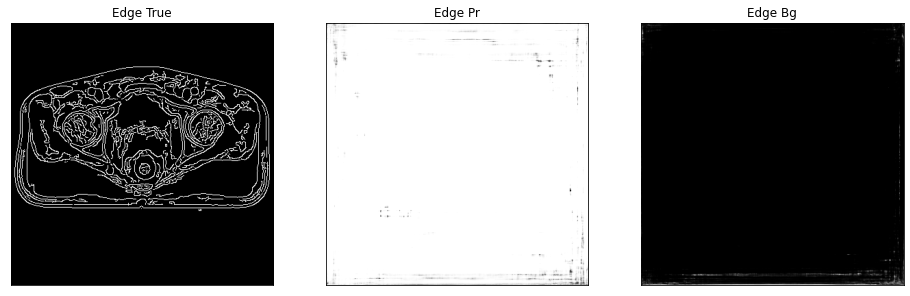

edge of ct_pred = 0.5791496634483337, edge of ct_true = 0.6175269484519958
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(5.6339e-24, device='cuda:0') tensor(1., device='cuda:0')


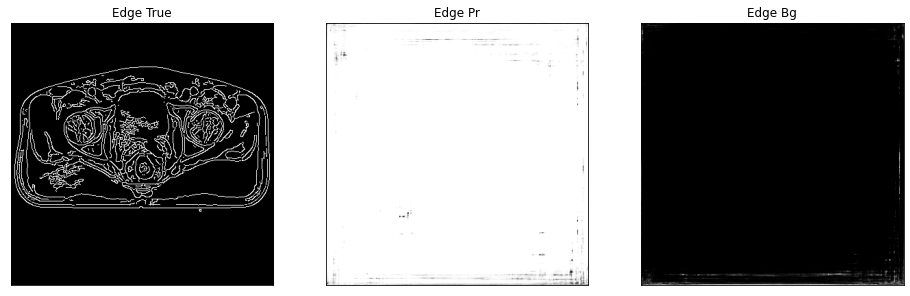

edge of ct_pred = 0.5788702964782715, edge of ct_true = 0.6178355813026428
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(5.8711e-26, device='cuda:0') tensor(1., device='cuda:0')


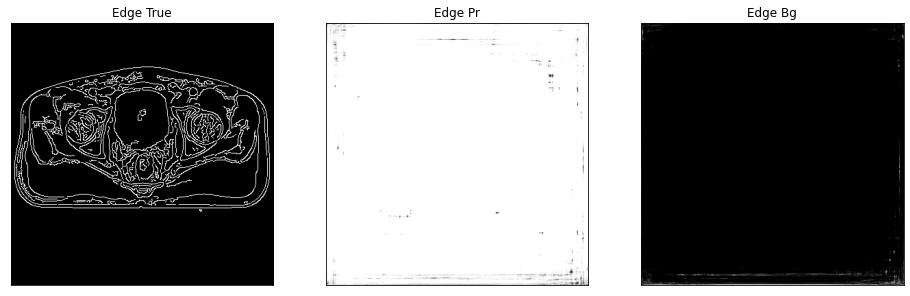

edge of ct_pred = 0.578928530216217, edge of ct_true = 0.616232693195343
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.0434e-25, device='cuda:0') tensor(1., device='cuda:0')


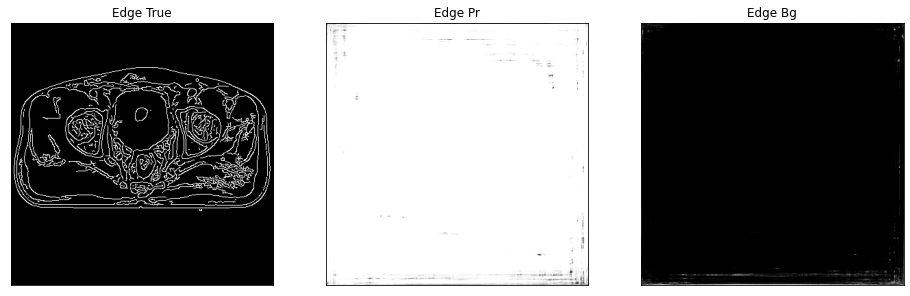

9it [00:27,  3.04s/it]

edge of ct_pred = 0.5794531106948853, edge of ct_true = 0.618315577507019
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.3115e-26, device='cuda:0') tensor(1., device='cuda:0')


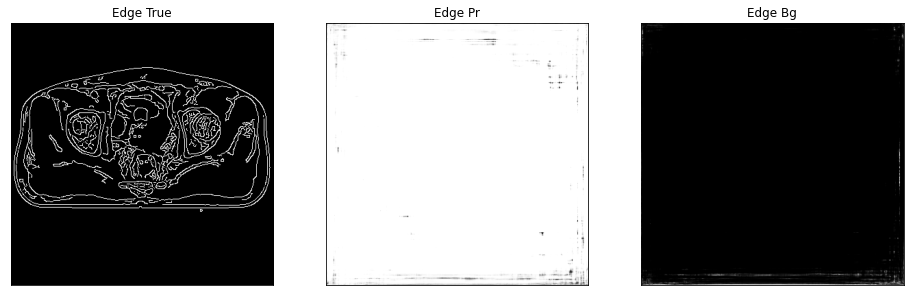

edge of ct_pred = 0.5790982246398926, edge of ct_true = 0.6160299777984619
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.0108e-26, device='cuda:0') tensor(1., device='cuda:0')


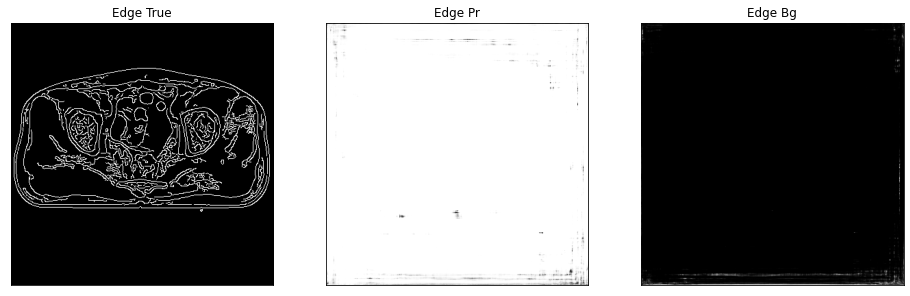

edge of ct_pred = 0.5789275169372559, edge of ct_true = 0.6167669892311096
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.5146e-26, device='cuda:0') tensor(1., device='cuda:0')


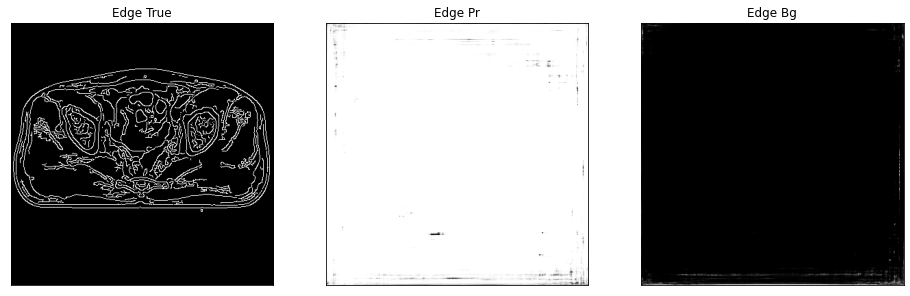

edge of ct_pred = 0.5787978768348694, edge of ct_true = 0.6173617839813232
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.5859e-25, device='cuda:0') tensor(1., device='cuda:0')


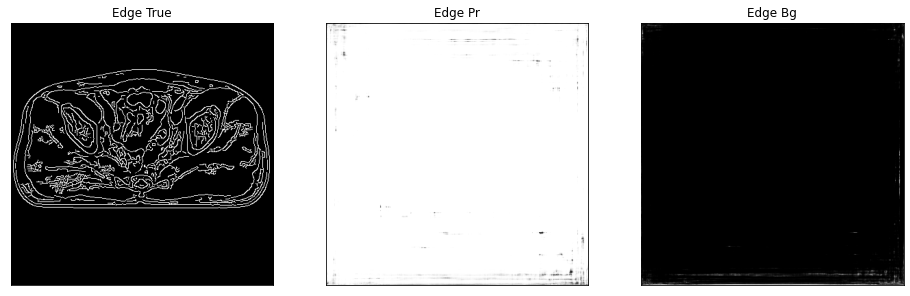

edge of ct_pred = 0.5793165564537048, edge of ct_true = 0.6174054145812988
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.8995e-26, device='cuda:0') tensor(1., device='cuda:0')


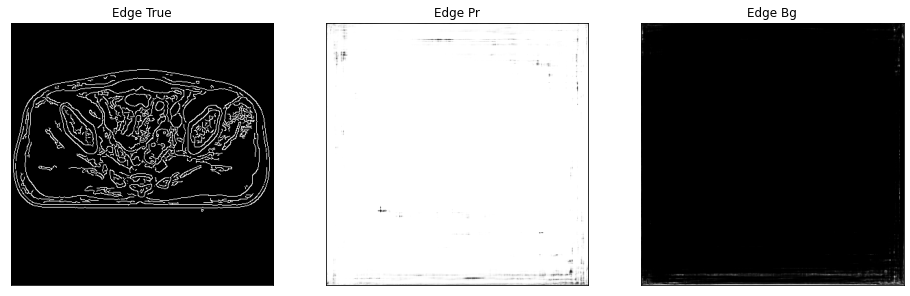

edge of ct_pred = 0.5795830488204956, edge of ct_true = 0.6163278818130493
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.5377e-25, device='cuda:0') tensor(1., device='cuda:0')


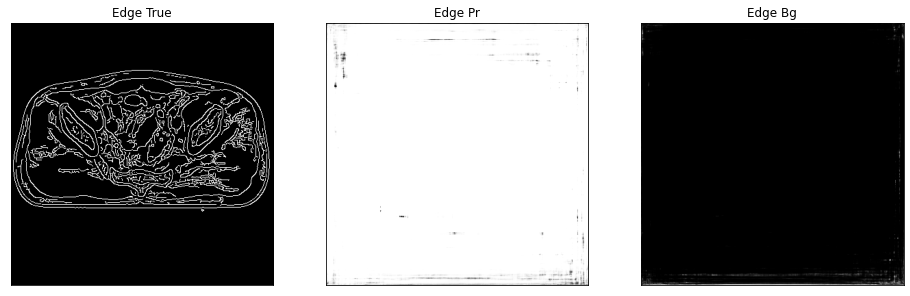

edge of ct_pred = 0.579367995262146, edge of ct_true = 0.6163320541381836
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.1874e-26, device='cuda:0') tensor(1., device='cuda:0')


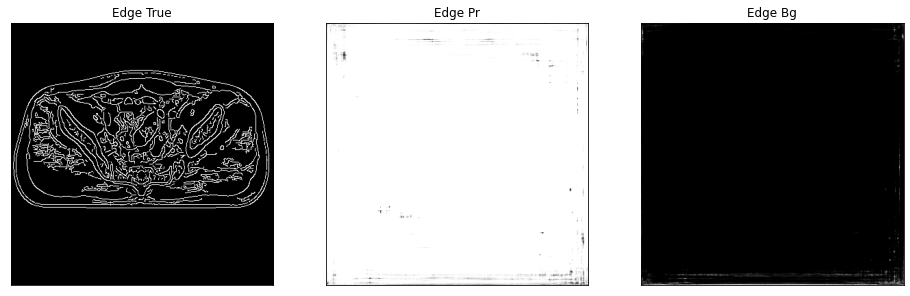

edge of ct_pred = 0.579135537147522, edge of ct_true = 0.6159171462059021
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.7493e-26, device='cuda:0') tensor(1., device='cuda:0')


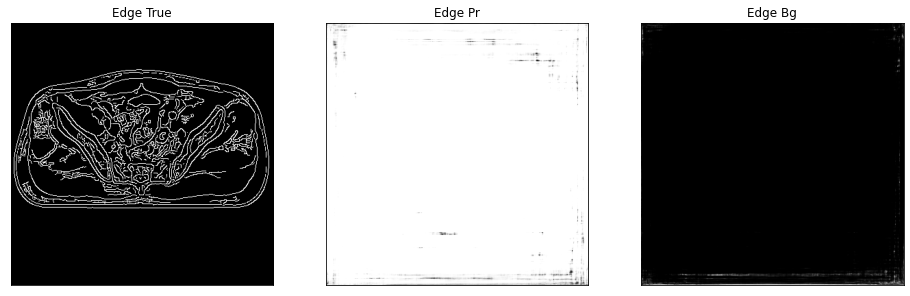

edge of ct_pred = 0.579325258731842, edge of ct_true = 0.6160320043563843
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(7.4363e-28, device='cuda:0') tensor(1., device='cuda:0')


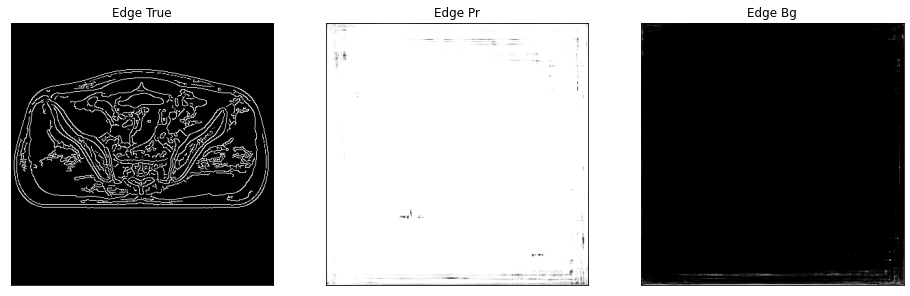

edge of ct_pred = 0.5791731476783752, edge of ct_true = 0.6149482727050781
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.6868e-27, device='cuda:0') tensor(1., device='cuda:0')


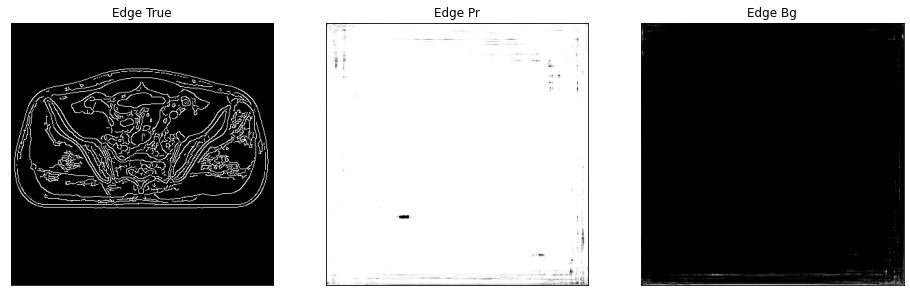

edge of ct_pred = 0.5790731906890869, edge of ct_true = 0.6152292490005493
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.5243e-26, device='cuda:0') tensor(1., device='cuda:0')


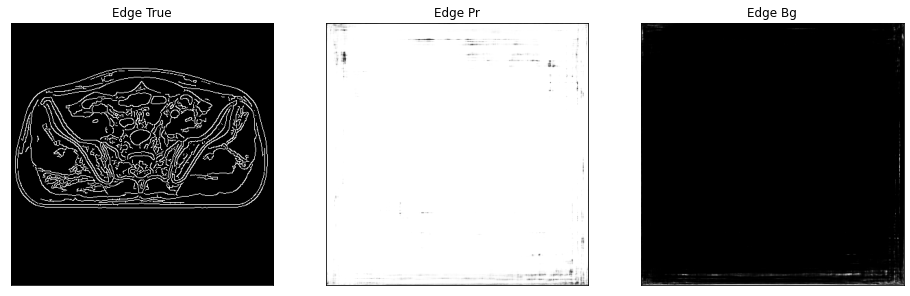

edge of ct_pred = 0.5793588757514954, edge of ct_true = 0.6154172420501709
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.3453e-25, device='cuda:0') tensor(1., device='cuda:0')


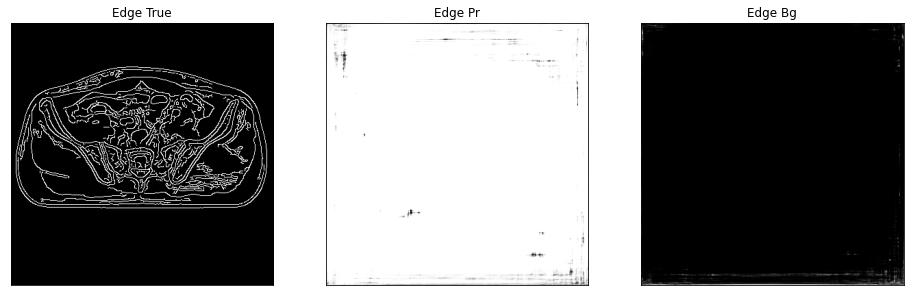

edge of ct_pred = 0.5791399478912354, edge of ct_true = 0.616154134273529
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(9.5053e-25, device='cuda:0') tensor(1., device='cuda:0')


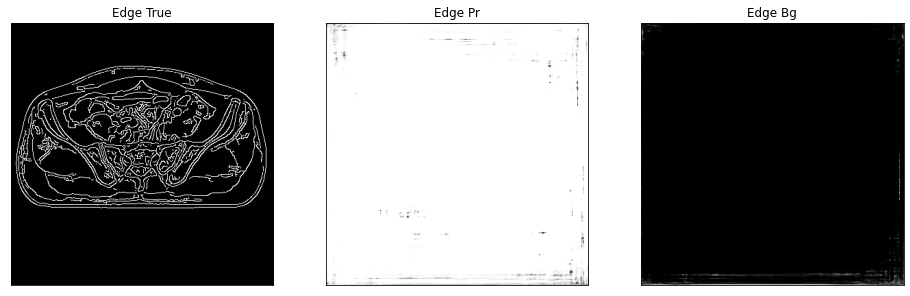

edge of ct_pred = 0.5791720151901245, edge of ct_true = 0.6144722700119019
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.3911e-26, device='cuda:0') tensor(1., device='cuda:0')


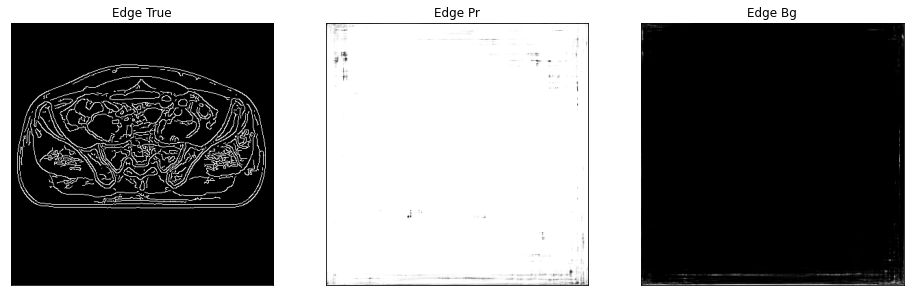

edge of ct_pred = 0.5792391896247864, edge of ct_true = 0.6153881549835205
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.1489e-26, device='cuda:0') tensor(1., device='cuda:0')


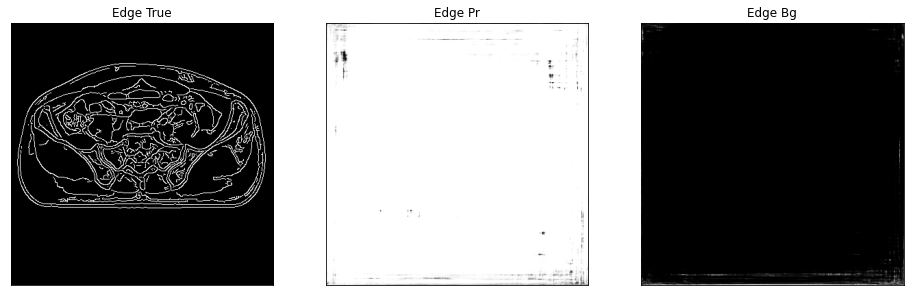

edge of ct_pred = 0.5790929198265076, edge of ct_true = 0.612992525100708
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(5.8544e-27, device='cuda:0') tensor(1., device='cuda:0')


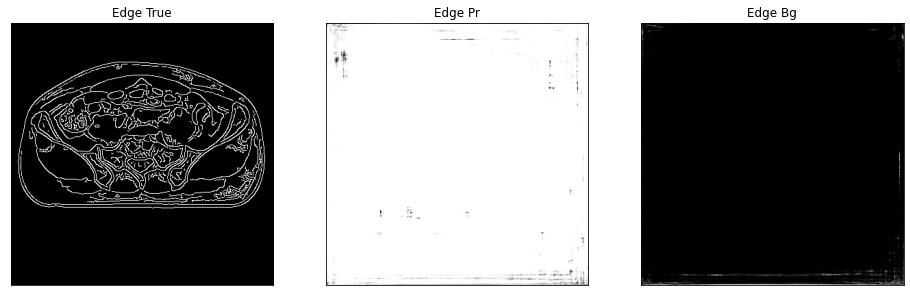

10it [00:30,  2.97s/it]

edge of ct_pred = 0.5790507793426514, edge of ct_true = 0.6151605248451233
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.0025e-27, device='cuda:0') tensor(1., device='cuda:0')


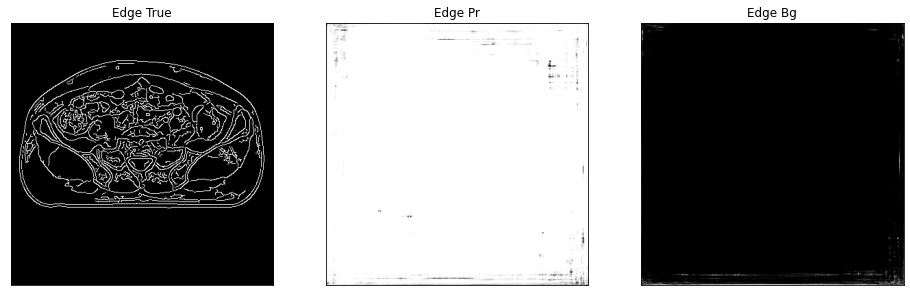

edge of ct_pred = 0.5791918039321899, edge of ct_true = 0.6133638620376587
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.8582e-25, device='cuda:0') tensor(1., device='cuda:0')


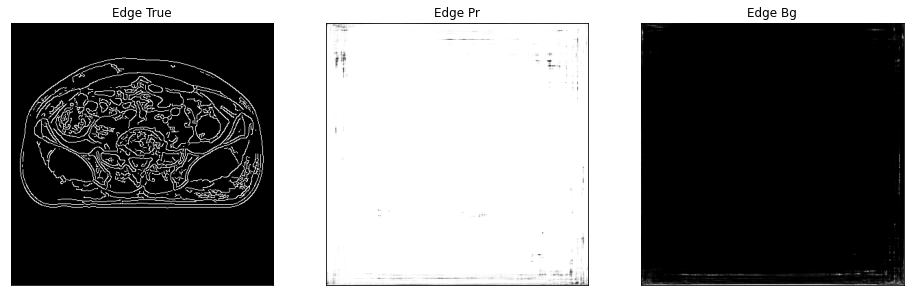

edge of ct_pred = 0.5791988968849182, edge of ct_true = 0.6126590371131897
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.0057e-25, device='cuda:0') tensor(1., device='cuda:0')


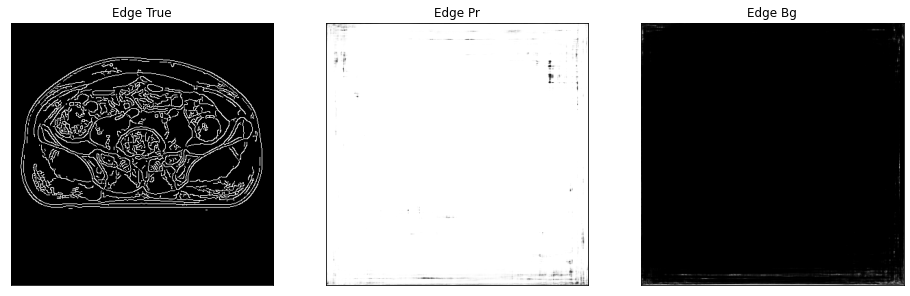

edge of ct_pred = 0.5793433785438538, edge of ct_true = 0.6143419146537781
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.7656e-25, device='cuda:0') tensor(1., device='cuda:0')


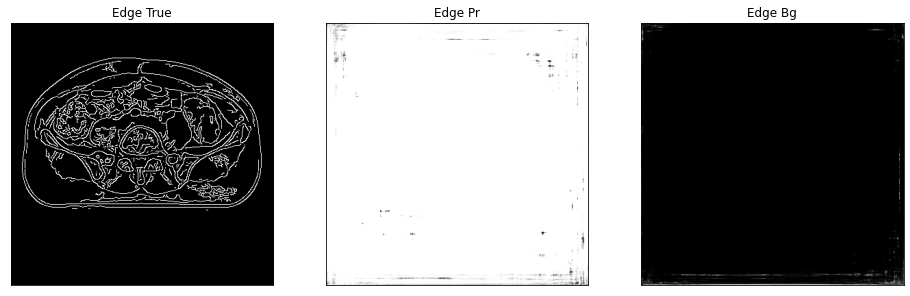

edge of ct_pred = 0.5777938961982727, edge of ct_true = 0.6182675957679749
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.1338e-24, device='cuda:0') tensor(1., device='cuda:0')


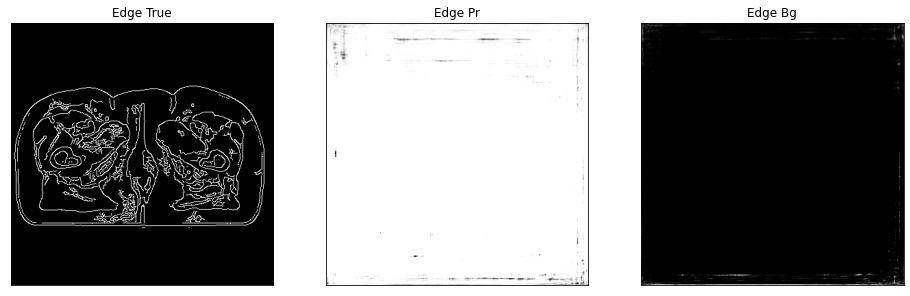

edge of ct_pred = 0.5779343247413635, edge of ct_true = 0.6166754961013794
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.4846e-25, device='cuda:0') tensor(1., device='cuda:0')


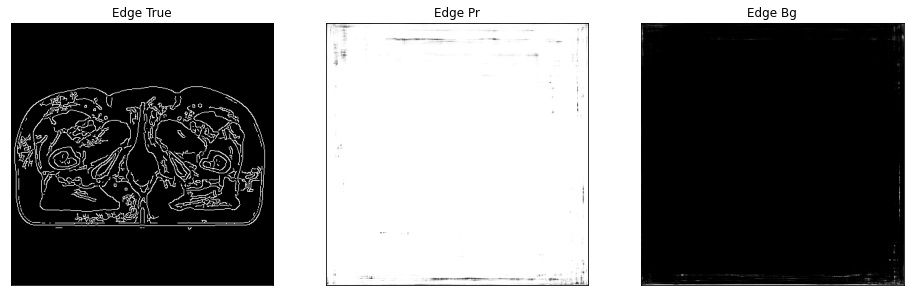

edge of ct_pred = 0.578670859336853, edge of ct_true = 0.6171025633811951
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.4913e-24, device='cuda:0') tensor(1., device='cuda:0')


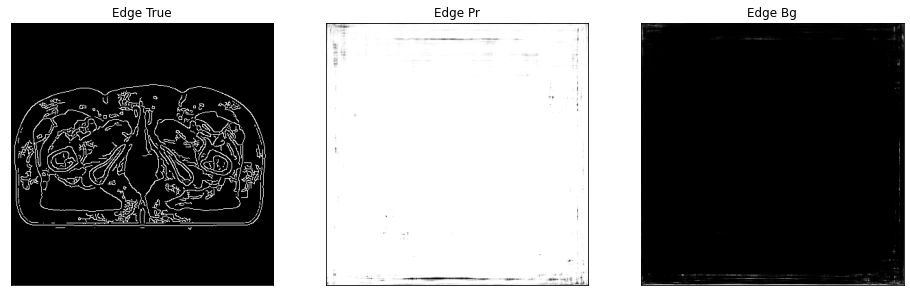

edge of ct_pred = 0.5780498385429382, edge of ct_true = 0.617834746837616
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.1902e-24, device='cuda:0') tensor(1., device='cuda:0')


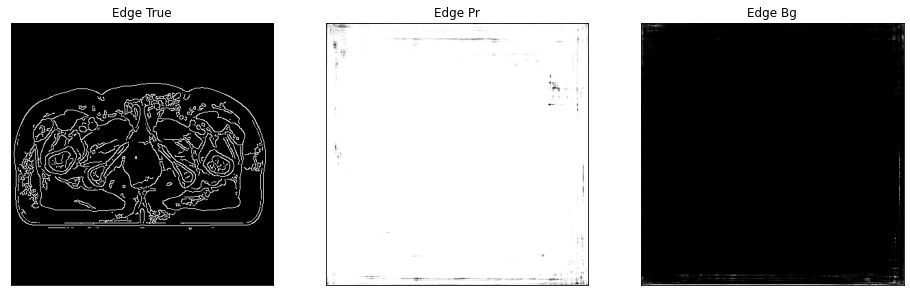

edge of ct_pred = 0.5783149600028992, edge of ct_true = 0.6154375076293945
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.2065e-24, device='cuda:0') tensor(1., device='cuda:0')


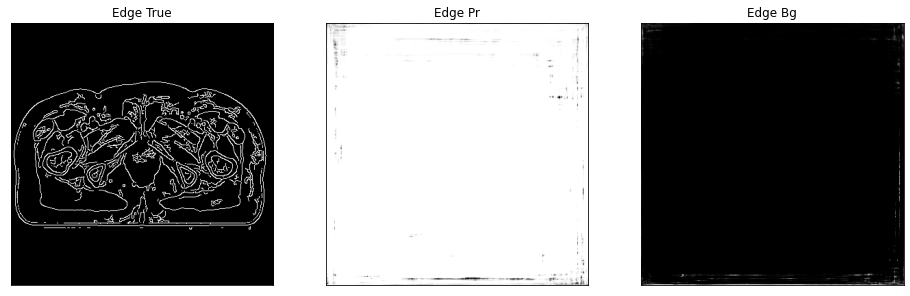

edge of ct_pred = 0.5783798694610596, edge of ct_true = 0.6168795228004456
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.2462e-25, device='cuda:0') tensor(1., device='cuda:0')


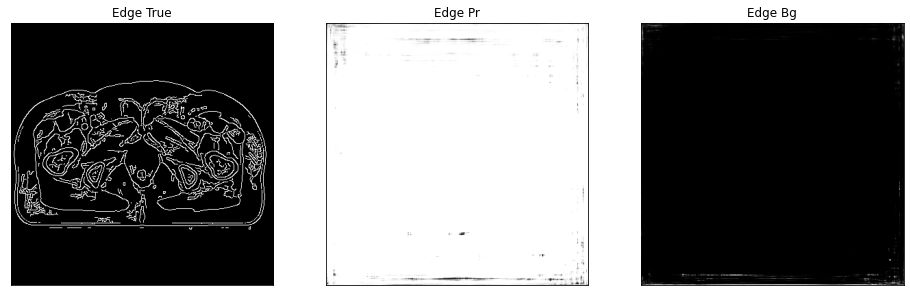

edge of ct_pred = 0.5778942108154297, edge of ct_true = 0.6162845492362976
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(9.0944e-26, device='cuda:0') tensor(1., device='cuda:0')


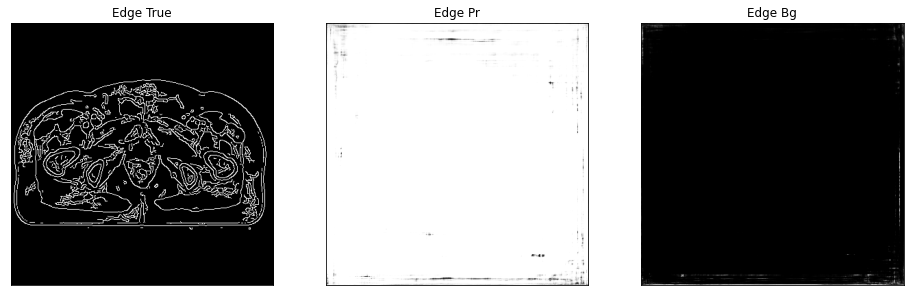

edge of ct_pred = 0.5783857107162476, edge of ct_true = 0.6156609654426575
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.7603e-25, device='cuda:0') tensor(1., device='cuda:0')


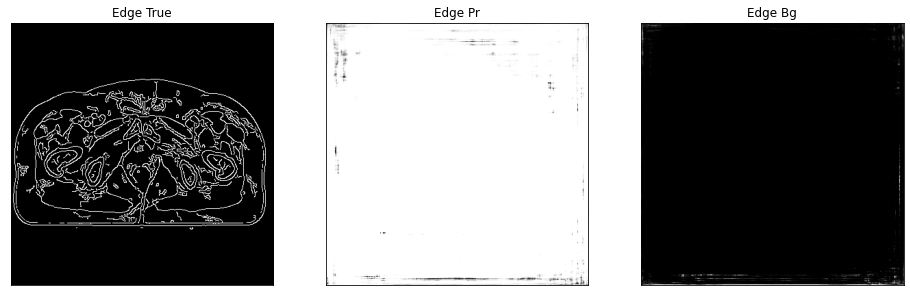

edge of ct_pred = 0.5778243541717529, edge of ct_true = 0.6145393252372742
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.0259e-24, device='cuda:0') tensor(1., device='cuda:0')


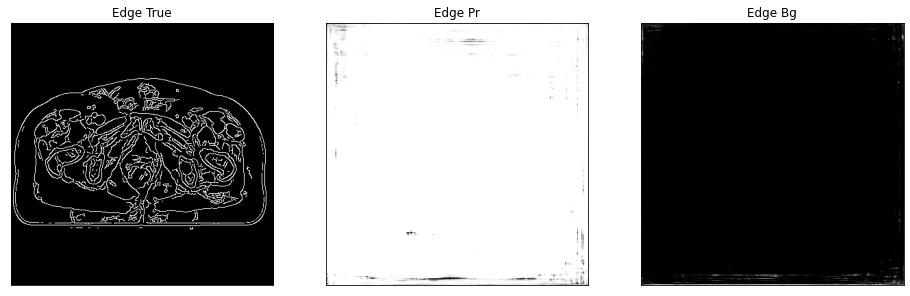

edge of ct_pred = 0.5784701704978943, edge of ct_true = 0.6162011623382568
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.0238e-25, device='cuda:0') tensor(1., device='cuda:0')


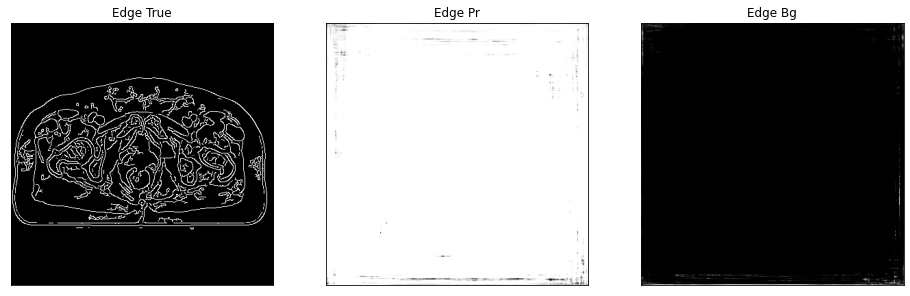

edge of ct_pred = 0.5782873630523682, edge of ct_true = 0.6147841215133667
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.7831e-25, device='cuda:0') tensor(1., device='cuda:0')


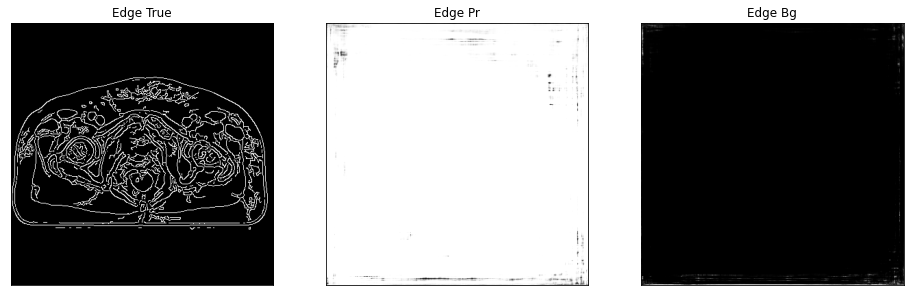

edge of ct_pred = 0.5784350037574768, edge of ct_true = 0.6135571002960205
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.1847e-25, device='cuda:0') tensor(1., device='cuda:0')


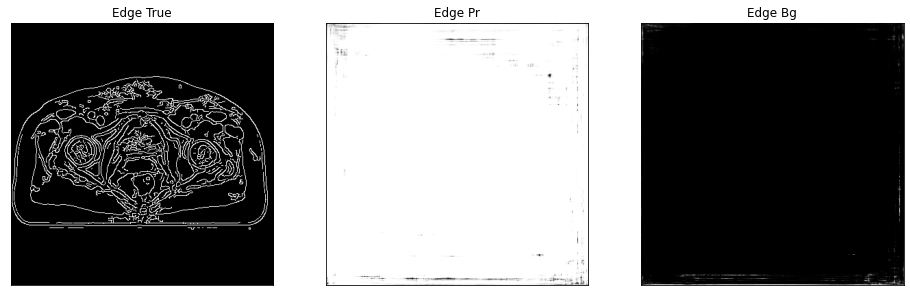

11it [00:33,  2.99s/it]

edge of ct_pred = 0.5782530307769775, edge of ct_true = 0.6140894293785095
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.1132e-25, device='cuda:0') tensor(1., device='cuda:0')


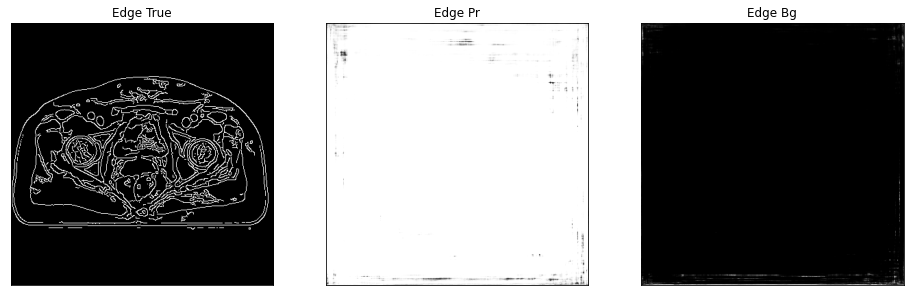

edge of ct_pred = 0.5780325531959534, edge of ct_true = 0.6155261993408203
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.6036e-25, device='cuda:0') tensor(1., device='cuda:0')


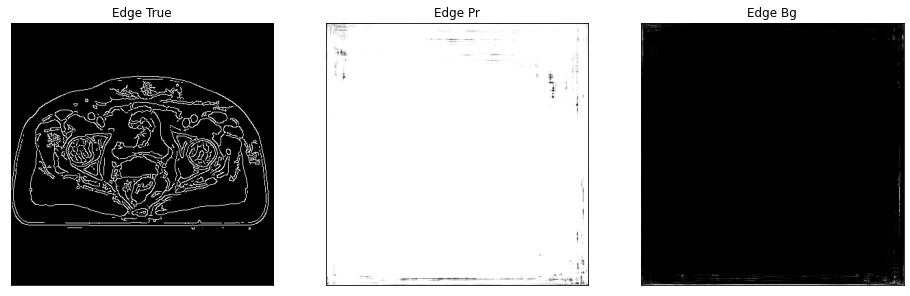

edge of ct_pred = 0.5786967873573303, edge of ct_true = 0.6153132319450378
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.1996e-26, device='cuda:0') tensor(1., device='cuda:0')


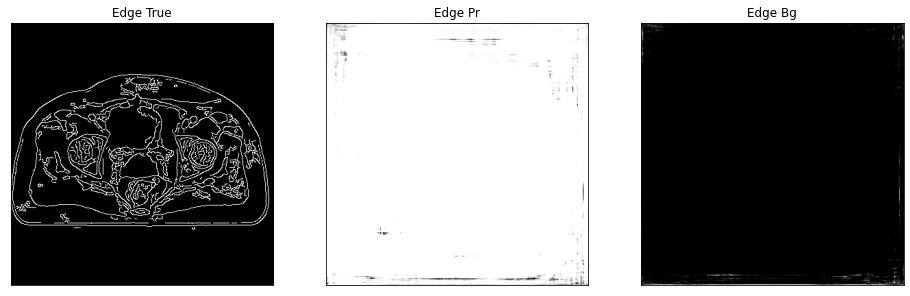

edge of ct_pred = 0.5783492922782898, edge of ct_true = 0.6173446774482727
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.8708e-25, device='cuda:0') tensor(1., device='cuda:0')


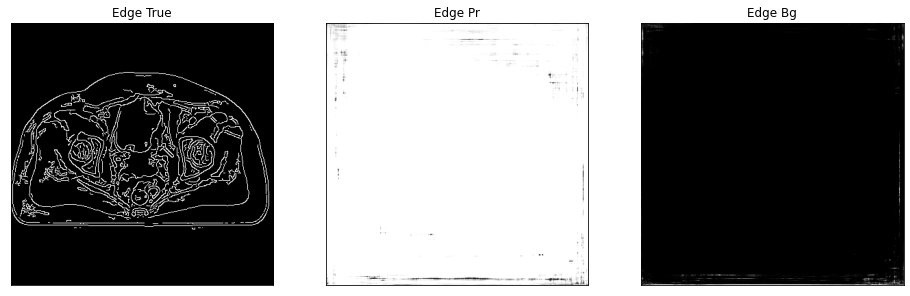

edge of ct_pred = 0.5786991119384766, edge of ct_true = 0.6147850751876831
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.2543e-25, device='cuda:0') tensor(1., device='cuda:0')


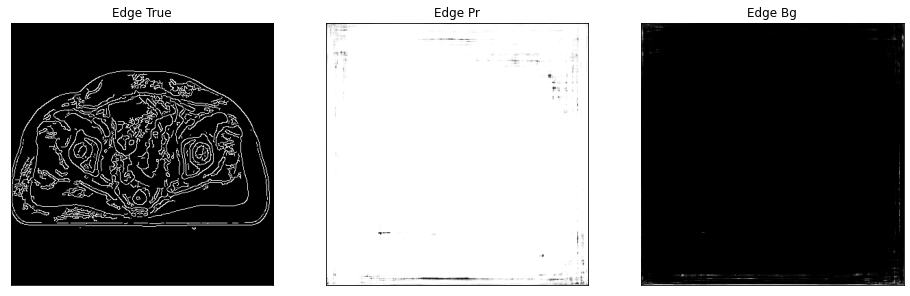

edge of ct_pred = 0.5785841345787048, edge of ct_true = 0.6140145659446716
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(3.1245e-26, device='cuda:0') tensor(1., device='cuda:0')


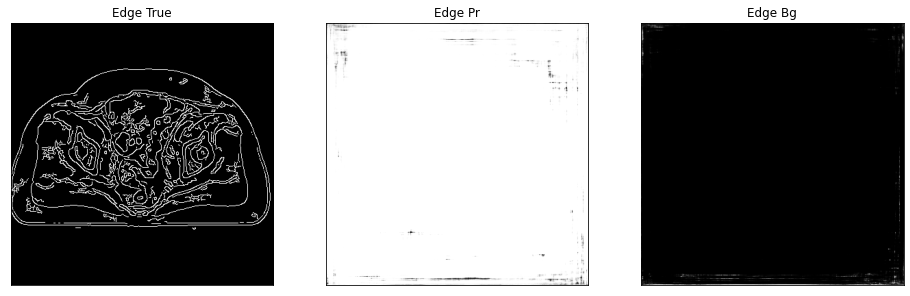

edge of ct_pred = 0.578713059425354, edge of ct_true = 0.6145294904708862
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.2145e-27, device='cuda:0') tensor(1., device='cuda:0')


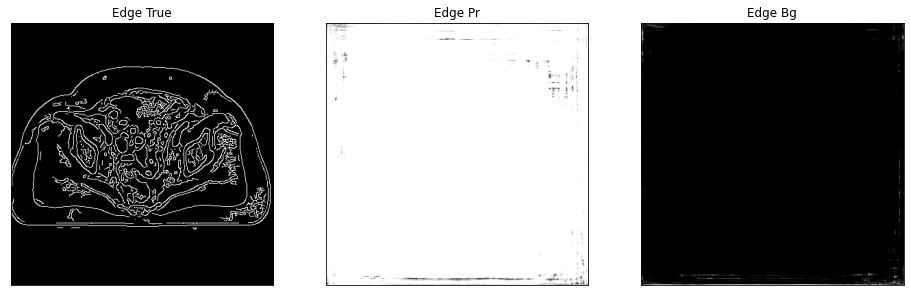

edge of ct_pred = 0.5787906050682068, edge of ct_true = 0.6137707233428955
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(4.1955e-26, device='cuda:0') tensor(1., device='cuda:0')


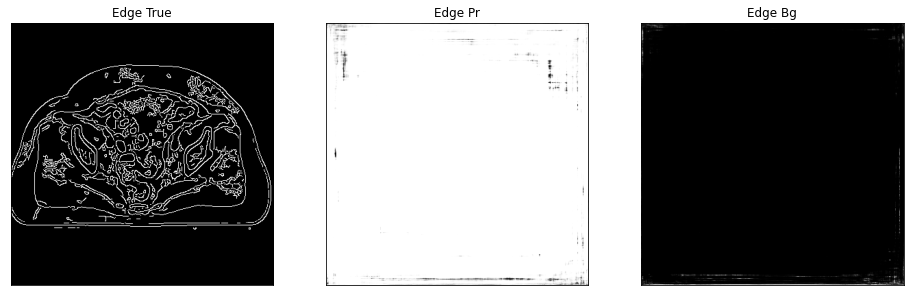

edge of ct_pred = 0.5788514018058777, edge of ct_true = 0.6168007850646973
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(2.4197e-25, device='cuda:0') tensor(1., device='cuda:0')


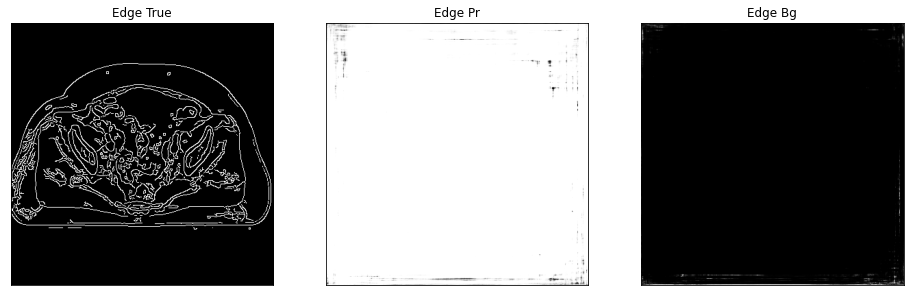

edge of ct_pred = 0.5790359973907471, edge of ct_true = 0.6140432357788086
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.1851e-25, device='cuda:0') tensor(1., device='cuda:0')


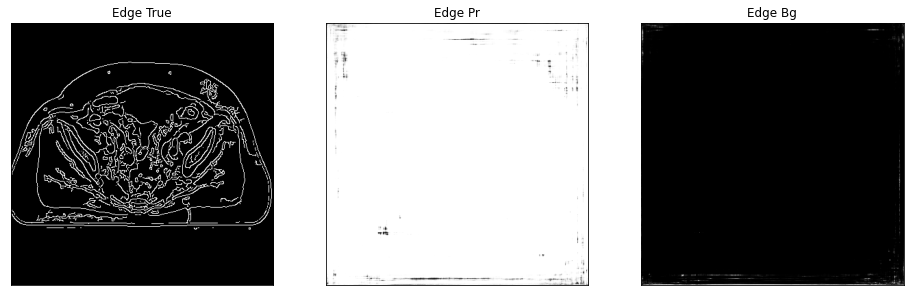

edge of ct_pred = 0.5788675546646118, edge of ct_true = 0.6145570874214172
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(5.3708e-26, device='cuda:0') tensor(1., device='cuda:0')


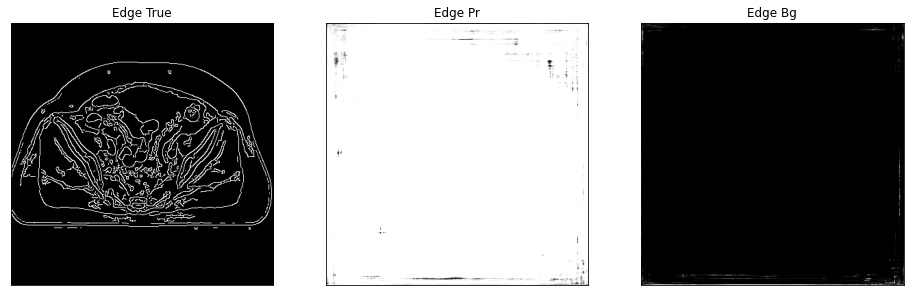

edge of ct_pred = 0.5793799161911011, edge of ct_true = 0.6132091283798218
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.3200e-25, device='cuda:0') tensor(1., device='cuda:0')


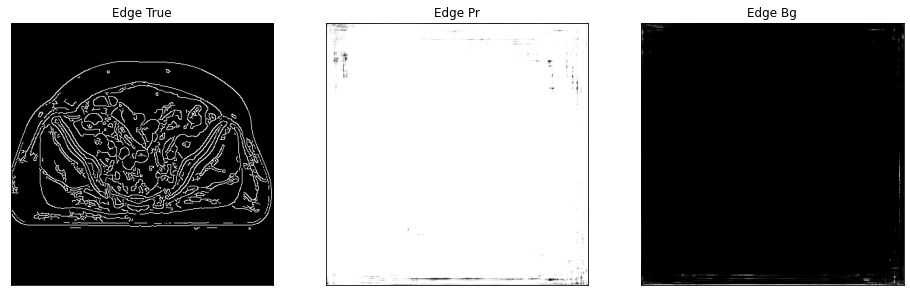

edge of ct_pred = 0.5793843269348145, edge of ct_true = 0.6140620112419128
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.0467e-25, device='cuda:0') tensor(1., device='cuda:0')


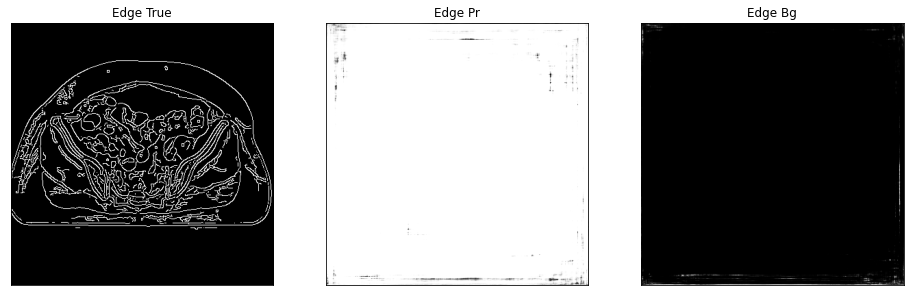

edge of ct_pred = 0.5788642168045044, edge of ct_true = 0.6131128668785095
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(6.7124e-27, device='cuda:0') tensor(1., device='cuda:0')


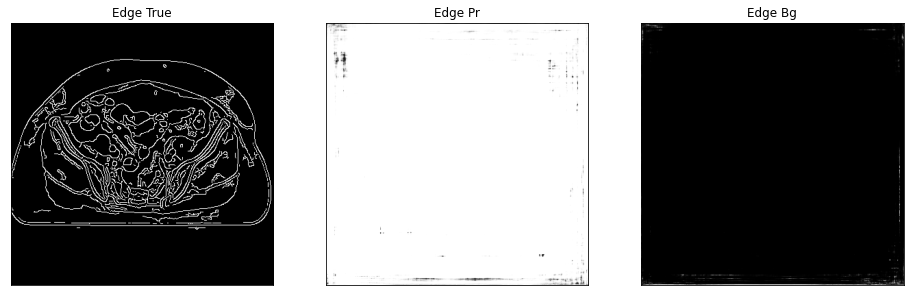

edge of ct_pred = 0.5795170068740845, edge of ct_true = 0.6150144934654236
tensor(0., device='cuda:0') tensor(1., device='cuda:0') tensor(1.2624e-26, device='cuda:0') tensor(1., device='cuda:0')


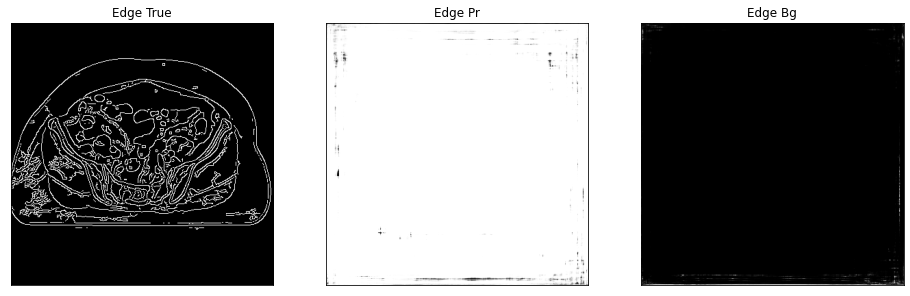

12it [00:36,  3.03s/it]


In [36]:
test_epoch(model, testloader, device, True, dir_path)

In [37]:
discriminator = Model(in_channel=DIS_IN_CHANNELS, n_classes=DIS_N_CLASSES, activation=DIS_ACT)

In [38]:
discriminator.load_state_dict(checkpoint["dicriminator"])

<All keys matched successfully>

In [39]:
# score_ssim_test, score_psnr_test, score_snr_test, score_mae_test, score_mask_test, score_acc_test 
# unmasked
eval_epoch(model, discriminator, testloader, device)

12it [00:05,  2.19it/s]


0.5

In [40]:
# import torchvision.models as models
# models.vgg16(pretrained=True)